In [1]:
import json
import math
import os
import re
import yaml
from collections import defaultdict
from dataclasses import dataclass, asdict
from pprint import pprint

import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Rectangle

from tqdm import tqdm
from datasets import load_dataset
from transformers import LlamaTokenizer, AutoTokenizer, LlamaConfig
import io   
from io import StringIO

from utils import *
from data import *

## How to use

This notebook is for collecting and visualizing the results of your runs.
1. You should run all the cells in the set-up sections, you will only need to run these once. You might want to change some of the settings, such as which models/task configs to parse from.
2. After your evaluation runs have finished, you can run the cells in the collect results section, which will also tell if you if it's missing any models.
3. Then, you can print out the main table.

## table-of-content
- [Set-up](#set-up)
- [Collect results](#collect-results)
- [Main table](#main-table)
- [Teaser figure](#teaser-figure)
- [Result by length](#result-by-length)
- [Correlation with one](#correlation-with-one)
- [Pairwise Correlation](#pairwise-correlation)
- [Heatmap by depth](#heatmap-by-depth)

## set-up

To add a new model, you should modify both the `models_configs` and `model_name_replace` variables.

In [2]:
dataset_to_metrics = {
    "json_kv": "substring_exact_match",
    "nq": "substring_exact_match",
    "popqa": "substring_exact_match",
    "triviaqa": "substring_exact_match",
    "hotpotqa": "substring_exact_match",
    
    "narrativeqa": ["rougeL_f1", "gpt-4-score"],
    "msmarco_rerank_psg": "NDCG@10",
    
    "trec_coarse": "exact_match",
    "trec_fine": "exact_match",
    "banking77": "exact_match",
    "clinic150": "exact_match",
    "nlu": "exact_match",
    
    "qmsum": "rougeL_recall",
    "multi_lexsum": ["rougeL_f1", "gpt-4-f1"],
    
    "ruler_niah_s_1": "ruler_recall",
    "ruler_niah_s_2": "ruler_recall",
    "ruler_niah_s_3": "ruler_recall",
    "ruler_niah_mk_1": "ruler_recall",
    "ruler_niah_mk_2": "ruler_recall",
    "ruler_niah_mk_3": "ruler_recall",
    "ruler_niah_mq": "ruler_recall",
    "ruler_niah_mv": "ruler_recall",
    "ruler_fwe": "ruler_recall",
    "ruler_cwe": "ruler_recall",
    "ruler_vt": "ruler_recall",
    "ruler_qa_1": "substring_exact_match",
    "ruler_qa_2": "substring_exact_match",
    
    "infbench_qa": [ "rougeL_f1"],
    "infbench_choice": ["exact_match"],
    "infbench_sum": ["rougeL_f1", "gpt-4-f1"],
    
    "alce_asqa_nocite": ["str_em"],
    "alce_qampari_nocite": ["qampari_rec_top5"],
    
    "alce_asqa": ["str_em", "citation_rec", "citation_prec"],
    "alce_qampari": ["qampari_rec_top5", "citation_rec", "citation_prec"],
}
dataset_to_metrics = {k: [v] if isinstance(v, str) else v for k, v in dataset_to_metrics.items()}

@dataclass
class arguments:
    tag: str = "v1"
    input_max_length: int = 131072
    generation_max_length: int = 100
    generation_min_length: int = 0
    max_test_samples: int = 100
    shots: int = 2
    do_sample: bool = False
    temperature: float = 0.0
    top_p: float = 1.0
    use_chat_template: bool = False
    seed: int = 42
    test_name: str = ""
    dataset: str = "nq"
    output_dir: str = ""
    popularity_threshold: float = 3
    flenqa_ctx_size: int = 1000
        
    def update(self, new):
        for key, value in new.items():
            if hasattr(self, key):
                setattr(self, key, value)
                
    def get_path(self):
        tag = self.tag
        path = os.path.join(args.output_dir, "{args.dataset}_{tag}_{args.test_name}_in{args.input_max_length}_size{args.max_test_samples}_shots{args.shots}_samp{args.do_sample}max{args.generation_max_length}min{args.generation_min_length}t{args.temperature}p{args.top_p}_chat{args.use_chat_template}_{args.seed}.json".format(args=self, tag=tag))
        if os.path.exists(path.replace(".json", "-gpt4eval_o.json")):
            return path.replace(".json", "-gpt4eval_o.json")
        if "alce" in self.dataset:
            return path.replace(".json", ".json.score")
        
        if os.path.exists(path + ".score"):
            return path + ".score"
        else:
            if os.path.exists(path):
                with open(path) as f:
                    x = json.load(f)
                with open(path + ".score", 'w') as f:
                    json.dump(x["averaged_metrics"], f, indent=4)
                return path + ".score"
        
        return path

    def get_metric_name(self):
        metric = None
        for d, m in dataset_to_metrics.items():
            if d in self.dataset:
                return d, m
        print("this shouldn't happen!!!", self.dataset)
        return None
    
    def get_averaged_metric(self):
        path = self.get_path()
        print(path)
        if not os.path.exists(path):
            return None
        with open(path) as f:
            results = json.load(f)
        
        _, metric = self.get_metric_name()

        
        if path.endswith(".score"):
            if any([m not in results for m in metric]):
                return None
            s = {m: results[m] for m in metric}
        else:
            if any([m not in results["averaged_metrics"] for m in metric]):
                return None
            s = {m: results['averaged_metrics'][m] for m in metric}

        # we normalize the gpt-4 score to [0, 100]
        s = {m : v * (100 if m == "gpt-4-f1" else 1) * (100/3 if m == "gpt-4-score" else 1) for m, v in s.items()}
        print(s)
        return s
        
    
    def get_metric_by_depth(self):
        path = self.get_path()
        path = path.replace(".score", '')
        print("checking:", path)
        if not os.path.exists(path):
            return None
        with open(path) as f:
            results = json.load(f)

        output = []        
        _, metric = self.get_metric_name()
        metric = metric[0]
        keys = ["depth", "k", metric]
        for d in results["data"]:
            o = {}
            for key in keys:
                if key == "k" and "ctxs" in d:
                    d["k"] = len(d['ctxs'])
                if key not in d:
                    print("no", key)
                    return None
                o[key] = d[key]
            o["metric"] = o.pop(metric)
            
            output.append(o)
        
        df = pd.DataFrame(output)
        dfs = df.groupby(list(output[0].keys())[:-1]).mean().reset_index()

        return dfs.to_dict("records")
    

In [3]:
config_files = [
    "configs/recall.yaml", "configs/recall_short.yaml", 
    "configs/rag.yaml", "configs/rag_short.yaml", 
    "configs/longqa.yaml", "configs/longqa_short.yaml", 
    "configs/summ.yaml", "configs/summ_short.yaml", 
    "configs/rerank.yaml", "configs/rerank_short.yaml", 
    "configs/icl.yaml", "configs/icl_short.yaml", 
    "configs/cite.yaml", "configs/cite_short.yaml", 
    "configs/ruler.yaml", "configs/ruler_short.yaml", 
]

dataset_configs = []
for file in config_files:
    c = yaml.safe_load(open(file))
    
    if isinstance(c["generation_max_length"], int):
        c["generation_max_length"] = ",".join([str(c["generation_max_length"])] * len(c["datasets"].split(",")))
    for d, t, l, g in zip(c['datasets'].split(','), c['test_files'].split(','), c['input_max_length'].split(','), c['generation_max_length'].split(',')):
        dataset_configs.append({"dataset": d, "test_name": os.path.basename(os.path.splitext(t)[0]), "input_max_length": int(l), "generation_max_length": int(g), "max_test_samples": c['max_test_samples'], 'use_chat_template': c['use_chat_template'], 'shots': c['shots']})
print(dataset_configs)

[{'dataset': 'ruler_niah_mk_2', 'test_name': 'validation_131072', 'input_max_length': 131072, 'generation_max_length': 50, 'max_test_samples': 100, 'use_chat_template': False, 'shots': 2}, {'dataset': 'ruler_niah_mk_3', 'test_name': 'validation_131072', 'input_max_length': 131072, 'generation_max_length': 100, 'max_test_samples': 100, 'use_chat_template': False, 'shots': 2}, {'dataset': 'ruler_niah_mv', 'test_name': 'validation_131072', 'input_max_length': 131072, 'generation_max_length': 50, 'max_test_samples': 100, 'use_chat_template': False, 'shots': 2}, {'dataset': 'json_kv', 'test_name': 'test_k1800_dep6', 'input_max_length': 131072, 'generation_max_length': 100, 'max_test_samples': 100, 'use_chat_template': False, 'shots': 2}, {'dataset': 'ruler_niah_mk_2', 'test_name': 'validation_8192', 'input_max_length': 8192, 'generation_max_length': 50, 'max_test_samples': 100, 'use_chat_template': False, 'shots': 2}, {'dataset': 'ruler_niah_mk_2', 'test_name': 'validation_16384', 'input_ma

In [4]:
models_configs = [
    {"model": "gpt-4-0125-preview", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-mini-2024-07-18", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-2024-05-13", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-2024-08-06", "use_chat_template": True, "training_length": 128000},
    {"model": "claude-3-5-sonnet-20240620", "use_chat_template": True, "training_length": 200000},
    {"model": "gemini-1.5-flash-001", "use_chat_template": True, "training_length": 1048576},
    {"model": "gemini-1.5-pro-001", "use_chat_template": True, "training_length": 2097152},

    # llama 2 based models
    {"model": "Llama-2-7B-32K", "use_chat_template": False, "training_length": 32768},
    {"model": "Llama-2-7B-32K-Instruct", "use_chat_template": False, "training_length": 32768},
    {"model": "llama-2-7b-80k", "use_chat_template": False, "training_length": 80000},
    {"model": "Yarn-Llama-2-7b-64k", "use_chat_template": False, "training_length": 65536},
    {"model": "Yarn-Llama-2-7b-128k", "use_chat_template": False, "training_length": 131072},
    
    # llama 3 models
    {"model": "Meta-Llama-3-8B", "use_chat_template": False, "training_length": 8192},
    {"model": "Meta-Llama-3-8B-Instruct", "training_length": 8192},
    {"model": "Meta-Llama-3-8B-Theta16M", "use_chat_template": False, "training_length": 8192},
    {"model": "Meta-Llama-3-8B-Instruct-Theta16M", "training_length": 8192},
    {"model": "Meta-Llama-3-70B-Theta16M", "use_chat_template": False, "training_length": 8192},
    {"model": "Meta-Llama-3-70B-Instruct-Theta16M", "training_length": 8192},
    
    {"model": "Llama-3.1-8B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.1-8B-Instruct", "training_length": 131072},
    {"model": "Llama-3.1-70B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.1-70B-Instruct", "training_length": 131072},
    {"model": "Llama-3.3-70B-Instruct", "training_length": 131072},
    
    {"model": "Llama-3.2-1B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.2-1B-Instruct", "training_length": 131072},
    {"model": "Llama-3.2-3B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.2-3B-Instruct", "training_length": 131072},
    
    # mistral models
    {"model": "Mistral-7B-v0.1", "use_chat_template": False, "training_length": 8192},
    {"model": "Mistral-7B-Instruct-v0.1", "training_length": 8192},
    {"model": "Mistral-7B-Instruct-v0.2", "training_length": 32768},
    {"model": "Mistral-7B-v0.3", "use_chat_template": False, "training_length": 32768},
    {"model": "Mistral-7B-Instruct-v0.3", "training_length": 32768},
    {"model": "Ministral-8B-Instruct-2410", "training_length": 131072},
    
    {"model": "Mistral-Nemo-Base-2407", "use_chat_template": False, "training_length": 128000},
    {"model": "Mistral-Nemo-Instruct-2407", "training_length": 128000},
    {"model": "MegaBeam-Mistral-7B-512k", "training_length": 524288},
    
    # yi models
    {"model": "Yi-6B-200K", "use_chat_template": False, "training_length": 200000},
    {"model": "Yi-9B-200K", "use_chat_template": False, "training_length": 200000},
    {"model": "Yi-34B-200K", "use_chat_template": False, "training_length": 200000},
    {"model": "Yi-1.5-9B-32K", "use_chat_template": False, "training_length": 32768},
    
    # phi models
    {"model": "Phi-3-mini-128k-instruct", "training_length": 131072},
    {"model": "Phi-3-small-128k-instruct", "training_length": 131072},
    {"model": "Phi-3-medium-128k-instruct", "training_length": 131072},
    {"model": "Phi-3.5-mini-instruct", "training_length": 131072},
    
    # qwen models
    {"model": "Qwen2-7B", "use_chat_template": False, "training_length": 32768},
    {"model": "Qwen2-7B-Instruct", "training_length": 32768},
    {"model": "Qwen2-57B-A14B", "use_chat_template": False, "training_length": 32768},
    {"model": "Qwen2-57B-A14B-Instruct", "training_length": 32768},
    {"model": "Qwen2.5-1.5B", "use_chat_template": False, "training_length": 32768},
    {"model": "Qwen2.5-1.5B-Instruct", "training_length": 32768},
    {"model": "Qwen2.5-3B", "use_chat_template": False, "training_length": 32768},
    {"model": "Qwen2.5-3B-Instruct", "training_length": 32768},
    {"model": "Qwen2.5-7B", "use_chat_template": False, "training_length": 131072},
    {"model": "Qwen2.5-7B-Instruct", "training_length": 131072},
    {"model": "Qwen2.5-7B-Instruct-1M", "training_length": 1010000},
    {"model": "Qwen2.5-14B-Instruct-1M", "training_length": 1010000},
    {"model": "Qwen2.5-72B-Instruct", "training_length": 131072},
    
    # prolong
    {"model": "Llama-3-8B-ProLong-512k-Instruct", "training_length": 524288},

    # Jamba
    {"model": "Jamba-v0.1", "use_chat_template": False, "training_length": 262144},
    {"model": "AI21-Jamba-1.5-Mini", "training_length": 262144},
    
    # gemma 2 models
    # {"model": "gemma-2-9b", "use_chat_template": False, "training_length": 8192},
    # {"model": "gemma-2-9b-it", "training_length": 8192},
    # {"model": "gemma-2-9b-it-Theta320K", "training_length": 8192},
    # {"model": "gemma-2-27b", "use_chat_template": False, "training_length": 8192},
    # {"model": "gemma-2-27b-it", "training_length": 8192},
    # {"model": "gemma-2-27b-it-Theta320K", "training_length": 8192},
    
    # others
    # {"model": "c4ai-command-r-v01", "training_length": 131072},
]

# models_configs = [
#         {"model": "Llama-3.1-8B", "use_chat_template": False, "training_length": 131072},
#         {"model": "Llama-3.1-8B-Instruct", "training_length": 131072},
#         {"model": "DeepSeek-R1-Distill-Llama-8B", "training_length": 131072, "do_sample": True, "temperature": 0.6},
#         {"model": "Qwen2-7B", "use_chat_template": False, "training_length": 32768},
#         {"model": "Qwen2-7B-Instruct", "training_length": 32768},
#         {"model": "DeepSeek-R1-Distill-Qwen-7B", "training_length": 131072, "do_sample": True, "temperature": 0.6},
# ]

for model in models_configs:
    model["output_dir"] = f"output/{model['model']}"

model2instruct = {x['model']: x.get("use_chat_template", True) for x in models_configs}
instruct_models = [x for x in model2instruct if model2instruct[x]]

In [5]:
# pretty names for the models
model_name_replace = {
    'gpt-4-0125-preview': 'GPT-4',
    'gpt-4o-2024-05-13': 'GPT-4o-05',
    'gpt-4o-2024-08-06': 'GPT-4o-08',
    'gpt-4o-mini-2024-07-18': 'GPT-4o-mini',
    'claude-3-5-sonnet-20240620': 'Claude-3.5-Sonnet',
    'gemini-1.5-flash-001': 'Gemini-1.5-Flash',
    'gemini-1.5-pro-001': 'Gemini-1.5-Pro',
    
    'Llama-2-7B-32K': 'Llama-2-7B-32k',
    'Llama-2-7B-32K-Instruct': 'Llama-2-7B-32k-Inst',
    'llama-2-7b-80k': 'Llama-7B-80k',
    'Yarn-Llama-2-7b-64k': 'Yarn-Llama-2-7B-64k',
    'Yarn-Llama-2-7b-128k': 'Yarn-Llama-2-7B-128k',
    'Meta-Llama-3-8B': 'Llama-3-8B',
    'Meta-Llama-3-8B-Instruct': 'Llama-3-8B-Inst',
    'Meta-Llama-3-8B-Theta16M': 'Llama-3-8B-θ',
    'Meta-Llama-3-8B-Instruct-Theta16M': 'Llama-3-8B-Inst-θ',
    'Meta-Llama-3-70B-Theta16M': 'Llama-3-70B-θ',
    'Meta-Llama-3-70B-Instruct-Theta16M': 'Llama-3-70B-Inst-θ',

    'Llama-3.1-8B': 'Llama-3.1-8B',
    'Llama-3.1-8B-Instruct': 'Llama-3.1-8B-Inst',
    'Llama-3.1-70B': 'Llama-3.1-70B',
    'Llama-3.1-70B-Instruct': 'Llama-3.1-70B-Inst',
    'Llama-3.3-70B-Instruct': 'Llama-3.3-70B-Inst',
    
    "Llama-3.2-1B": "Llama-3.2-1B",
    "Llama-3.2-1B-Instruct": "Llama-3.2-1B-Inst",
    "Llama-3.2-3B": "Llama-3.2-3B",
    "Llama-3.2-3B-Instruct": "Llama-3.2-3B-Inst",
    
    'Mistral-7B-v0.1': 'Mistral-7B-v0.1',
    'Mistral-7B-Instruct-v0.1': 'Mistral-7B-Inst-v0.1',
    'Mistral-7B-Instruct-v0.2': 'Mistral-7B-Inst-v0.2',
    'Mistral-7B-v0.3': 'Mistral-7B-v0.3',
    'Mistral-7B-Instruct-v0.3': 'Mistral-7B-Inst-v0.3',
    'Mistral-Nemo-Base-2407': 'Mistral-Nemo',
    'Mistral-Nemo-Instruct-2407': 'Mistral-Nemo-Inst',
    'MegaBeam-Mistral-7B-512k': 'MegaBeam-Mistral',
    'Ministral-8B-Instruct-2410': 'Ministral-8B-Inst',
    
    'Yi-6B-200K': 'Yi-6B-200k',
    'Yi-9B-200K': 'Yi-9B-200k',
    'Yi-34B-200K': 'Yi-34B-200k',
    'Yi-1.5-9B-32K': 'Yi-1.5-9B-32k',
    'Phi-3-mini-128k-instruct': 'Phi-3-mini-128k-Inst',
    'Phi-3-small-128k-instruct': 'Phi-3-small-128k-Inst',
    'Phi-3-medium-128k-instruct': 'Phi-3-med-128k-Inst',
    'Phi-3.5-mini-instruct': 'Phi-3.5-mini-Inst',
    'Qwen2-7B': 'Qwen2-7B',
    'Qwen2-7B-Instruct': 'Qwen2-7B-Inst',
    'Qwen2-57B-A14B': 'Qwen2-57B',
    'Qwen2-57B-A14B-Instruct': 'Qwen2-57B-Inst',

    'Qwen2.5-1.5B': 'Qwen2.5-1.5B',
    'Qwen2.5-1.5B-Instruct': 'Qwen2.5-1.5B-Inst',
    'Qwen2.5-3B': 'Qwen2.5-3B',
    'Qwen2.5-3B-Instruct': 'Qwen2.5-3B-Inst',
    'Qwen2.5-7B': 'Qwen2.5-7B',
    'Qwen2.5-7B-Instruct': 'Qwen2.5-7B-Inst',
    'Qwen2.5-7B-Instruct-1M': 'Qwen2.5-7B-Inst-1M',
    'Qwen2.5-14B-Instruct-1M': 'Qwen2.5-14B-Inst-1M',
    'Qwen2.5-72B-Instruct': 'Qwen2.5-72B-Inst',
    
    # 'c4ai-command-r-v01': 'Command-R',
    'Jamba-v0.1': 'Jamba-v0.1',
    'AI21-Jamba-1.5-Mini': 'Jamba-1.5-Mini',
    'Llama-3-8B-ProLong-512k-Instruct': 'ProLong',

    "DeepSeek-R1-Distill-Llama-8B": "DS-R1-Llama-8B",
    "DeepSeek-R1-Distill-Qwen-7B": "DS-R1-Qwen-7B",
    
    # 'gemma-2-9b': 'Gemma-2-9B',
    # 'gemma-2-9b-it': 'Gemma-2-9B-Inst',
    # 'gemma-2-9b-it-Theta320K': 'Gemma-2-9B-Inst-θ',
    # 'gemma-2-27b': 'Gemma-2-27B',
    # 'gemma-2-27b-it': 'Gemma-2-27B-Inst',
    # 'gemma-2-27b-it-Theta320K': 'Gemma-2-27B-Inst-θ',
}

In [6]:
dataset_name_replace = {
    "model": "Model",
    
    # Synthetic/RULER
    'json_kv substring_exact_match': "JSON KV",
    'ruler_niah_s_1 ruler_recall': "NIAH S Repeat",
    'ruler_niah_s_2 ruler_recall': "NIAH", 
    'ruler_niah_s_3 ruler_recall': "NIAH S UUID",
    'ruler_niah_mk_1 ruler_recall': "NIAH MK Essay",
    'ruler_niah_mk_2 ruler_recall': "NIAH MK Needle",
    'ruler_niah_mk_3 ruler_recall': "NIAH MK UUID",
    'ruler_niah_mq ruler_recall': "NIAH MQ",
    'ruler_niah_mv ruler_recall': "NIAH MV",
    'ruler_cwe ruler_recall': "CWE",
    'ruler_fwe ruler_recall': "FWE",
    'ruler_vt ruler_recall': "VT",
    'ruler_qa_1 substring_exact_match': "RULER SQuAD",
    'ruler_qa_2 substring_exact_match': "RULER HotpotQA",

    # RAG
    'nq substring_exact_match': "NQ",
    'hotpotqa substring_exact_match': "HotpotQA",
    'popqa substring_exact_match': "PopQA",
    'triviaqa substring_exact_match': "TriviaQA",

    # ICL
    'trec_coarse exact_match': "TREC Coarse",
    'trec_fine exact_match': "TREC Fine",
    'banking77 exact_match': "BANKING77",
    'clinic150 exact_match': "CLINIC150",
    'nlu exact_match': "NLU",

    # Cite
    'alce_asqa str_em': "ALCE ASQA Correctness",
    'alce_asqa citation_rec': "ALCE ASQA Cite Recall",
    'alce_asqa citation_prec': "ALCE ASQA Cite Precision",
    'alce_qampari qampari_rec_top5': "QAMPARI Correctness",
    'alce_qampari citation_rec': "QAMPARI Cite Recall",
    'alce_qampari citation_prec': "QAMPARI Cite Precision",

    # Re-rank
    'msmarco_rerank_psg NDCG@10': "MSMARCO",

    # LongQA
    'narrativeqa gpt-4-score': "NarrativeQA",
    'narrativeqa rougeL_f1': "NarrativeQA ROUGE",
    'narrativeqa f1': "NarrativeQA F1",
    'infbench_qa substring_exact_match': "InfBench QA SubEM",
    'infbench_qa rougeL_f1': "InfBench QA",
    'infbench_choice exact_match': "InfBench MC",
    
    # Summ
    'infbench_sum gpt-4-f1': "InfBench Sum",
    'infbench_sum rougeL_f1': "InfBench Sum ROUGE",
    'multi_lexsum gpt-4-f1': "Multi-LexSum",
    'multi_lexsum rougeL_f1': "Multi-LexSum ROUGE",
}

custom_avgs = {
    "Recall": ["json_kv substring_exact_match", "ruler_niah_mk_2 ruler_recall", "ruler_niah_mk_3 ruler_recall", "ruler_niah_mv ruler_recall"],
    "RAG": ['nq substring_exact_match', 'hotpotqa substring_exact_match', 'popqa substring_exact_match', 'triviaqa substring_exact_match',],
    "ICL": ['trec_coarse exact_match', 'trec_fine exact_match', 'banking77 exact_match', 'clinic150 exact_match', 'nlu exact_match'],
    "Cite": ['alce_asqa str_em', 'alce_asqa citation_rec', 'alce_asqa citation_prec', 'alce_qampari qampari_rec_top5', 'alce_qampari citation_rec', 'alce_qampari citation_prec', ],
    "Re-rank": ['msmarco_rerank_psg NDCG@10', ],
    "LongQA": ['narrativeqa gpt-4-score', 'infbench_qa rougeL_f1', 'infbench_choice exact_match', ],
    "Summ": ['infbench_sum gpt-4-f1', 'multi_lexsum gpt-4-f1', ],
    "RULER": ['ruler_niah_s_1 ruler_recall', 'ruler_niah_s_2 ruler_recall', 'ruler_niah_s_3 ruler_recall', 'ruler_niah_mk_1 ruler_recall', 'ruler_niah_mk_2 ruler_recall', 'ruler_niah_mk_3 ruler_recall', 'ruler_niah_mq ruler_recall', 'ruler_niah_mv ruler_recall', 'ruler_cwe ruler_recall', 'ruler_fwe ruler_recall', 'ruler_vt ruler_recall', 'ruler_qa_1 substring_exact_match', 'ruler_qa_2 substring_exact_match'],
    "Ours": ['Recall', 'RAG', 'ICL', 'Cite', 'Re-rank', 'LongQA', 'Summ'],
}

In [ ]:
teaser_table_datasets = [
    'ruler_niah_s_2 ruler_recall',
    "RULER",
    "Ours",
]
teaser_table_models = [
    'Llama-3.1-8B-Instruct',
    'Llama-3.1-70B-Instruct',
    'gpt-4o-mini-2024-07-18',
    'gpt-4o-2024-08-06',
    'gemini-1.5-flash-001',
    'gemini-1.5-pro-001',
]


main_table_datasets = [
    "Recall",
    'RAG',
    "Cite", 
    'Re-rank',
    "LongQA",
    "Summ",
    'ICL',
    "Ours"
]

main_table_models = [
    'gpt-4-0125-preview',
    'gpt-4o-2024-05-13',
    'gpt-4o-2024-08-06',
    'gpt-4o-mini-2024-07-18',
    'claude-3-5-sonnet-20240620',
    'gemini-1.5-flash-001',
    'gemini-1.5-pro-001',
    'Meta-Llama-3.1-8B-Instruct',
    'Meta-Llama-3.1-70B-Instruct',
#     'Mistral-7B-Instruct-v0.3',
    'Mistral-Nemo-Instruct-2407',
    'MegaBeam-Mistral-7B-512k',
    'Phi-3-mini-128k-instruct',
    'Phi-3-small-128k-instruct',
    'Phi-3-medium-128k-instruct',
    'Phi-3.5-mini-instruct',
#     'Qwen2-7B-Instruct',
#     'Qwen2-57B-A14B-Instruct',
    'AI21-Jamba-1.5-Mini',
    'prolong-512k-instruct-20b-theta128m',
]

by_length_datasets = ['ruler_niah_s_2 ruler_recall', 'popqa substring_exact_match', 'alce_asqa str_em', 'alce_asqa citation_rec',]
by_length_models = [
    'gpt-4-0125', 'gpt-4o-mini', 'gpt-4o-2024-05-13', 'gpt-4o-2024-08-06', 'gemini-1.5-flash-001', 'gemini-1.5-pro-001', 
    'Meta-Llama-3.1-8B-Instruct', 'Meta-Llama-3.1-70B-Instruct', 'AI21-Jamba-1.5-Mini', 'prolong-512k-instruct-20b-theta128m', 
    'Meta-Llama-3-8B-Instruct', 'Meta-Llama-3-8B-Instruct-Theta8M', 'Meta-Llama-3-70B-Instruct-Theta8M',
    'Qwen2-7B-Instruct', 'Qwen2-57B-A14B-Instruct',
]

full_table_datasets = [
    "json_kv substring_exact_match", "ruler_niah_mk_2 ruler_recall", "ruler_niah_mk_3 ruler_recall", "ruler_niah_mv ruler_recall",
    "Synthetic",
    'ODQA',
    'ICL',
    'alce_asqa str_em',
    'alce_asqa citation_rec',
    'alce_asqa citation_prec',
    'alce_qampari qampari_rec_top5',
    'alce_qampari citation_rec',
    'alce_qampari citation_prec',
    "ALCE", 
    'Re-rank',
    'narrativeqa gpt-4-score',
    'infbench_qa rougeL_f1',
    'infbench_choice exact_match',
    'LongQA',
    'infbench_sum gpt-4-f1',
    'multi_lexsum gpt-4-f1',
    "Summ",
    "Ours",
]

full_table_models = [
    'gpt-4-0125-preview',
    'gpt-4o-2024-05-13',
    'gpt-4o-2024-08-06',
    'gpt-4o-mini-2024-07-18',
    'claude-3-5-sonnet-20240620',
    'gemini-1.5-flash-001',
    'gemini-1.5-pro-001',
    
    'Meta-Llama-3-8B-Theta8M',
    'Meta-Llama-3-8B-Instruct-Theta8M',
    'Meta-Llama-3-70B-Theta8M',
    'Meta-Llama-3-70B-Instruct-Theta8M',
    
    'Meta-Llama-3.1-8B',
    'Meta-Llama-3.1-8B-Instruct',
    'Meta-Llama-3.1-70B',
    'Meta-Llama-3.1-70B-Instruct',
    
    "Llama-3.2-1B",
    "Llama-3.2-1B-Instruct",
    "Llama-3.2-3B",
    "Llama-3.2-3B-Instruct",
    
    'llama-2-7b-80k-basefixed',
    'Yarn-Llama-2-7b-128k',
    
    'Mistral-7B-Instruct-v0.1',
    'Mistral-7B-Instruct-v0.2',
    'Mistral-7B-v0.3',
    'Mistral-7B-Instruct-v0.3',
    'Mistral-Nemo-Instruct-2407',
    'MegaBeam-Mistral-7B-512k',
    
    'Phi-3-mini-128k-instruct',
    'Phi-3-small-128k-instruct',
    'Phi-3-medium-128k-instruct',
    'Phi-3.5-mini-instruct',
    
    'Yi-6B-200K',
    'Yi-9B-200K',
    'Yi-34B-200K',
    
    'Qwen2-7B-Instruct',
    'Qwen2-57B-A14B-Instruct',
    'AI21-Jamba-1.5-Mini',
    'prolong-512k-instruct-20b-theta128m',
]

long_text_datasets = ['narrativeqa f1', 'narrativeqa gpt-4-score', 'infbench_sum rougeL_f1', 'infbench_sum gpt-4-f1', 'multi_lexsum rougeL_f1', 'multi_lexsum gpt4-f1',]
long_text_models = [
    'gpt-4o-2024-05-13', 'gpt-4o-2024-08-06', 'claude-3-5-sonnet-20240620', 'gemini-1.5-pro-001', 'gemini-1.5-flash-001',
    'Meta-Llama-3-8B-Instruct', "Meta-Llama-3-8B-Instruct-Theta8M", "Meta-Llama-3-70B-Instruct-Theta8M",
    'Meta-Llama-3.1-8B-Instruct', 'Meta-Llama-3.1-70B-Instruct', 'Llama-3.2-1B-Instruct', 'Llama-3.2-3B-Instruct',
    'Mistral-7B-Instruct-v0.1', 'Mistral-7B-Instruct-v0.2', 'Mistral-7B-Instruct-v0.3'
]

instruct_models = [x['model'] for x in models_configs if x.get("use_chat_template", True)]

corr_datasets = [
    'json_kv substring_exact_match',
    'ruler_niah_s_2 ruler_recall',
    'ruler_niah_mk_2 ruler_recall',
    'ruler_niah_mq ruler_recall',
    'ruler_niah_mv ruler_recall',
    'ruler_cwe ruler_recall',
    'ruler_fwe ruler_recall',
    'ruler_vt ruler_recall',
    'RULER',
    'ODQA',
    'ALCE',
    'Re-rank',
    'LongQA',
    'Summ',
    'ICL',
    'Ours',
]
corr_models = list(model_name_replace.keys())

full_table_datasets = [
    "json_kv substring_exact_match", "ruler_niah_mk_2 ruler_recall", "ruler_niah_mk_3 ruler_recall", "ruler_niah_mv ruler_recall",
    "Synthetic",
    'ODQA',
    'ICL',
    'alce_asqa str_em',
    'alce_asqa citation_rec',
    'alce_asqa citation_prec',
    'alce_qampari qampari_rec_top5',
    'alce_qampari citation_rec',
    'alce_qampari citation_prec',
    "ALCE", 
    'Re-rank',
    'narrativeqa gpt-4-score',
    'infbench_qa rougeL_f1',
    'infbench_choice exact_match',
    'LongQA',
    'infbench_sum gpt-4-f1',
    'multi_lexsum gpt-4-f1',
    "Summ",
    "Ours",
]

corr_full_datasets = [
    'nq substring_exact_match',
    'hotpotqa substring_exact_match',
    'popqa substring_exact_match',
    'triviaqa substring_exact_match',
    'ODQA',
    'alce_asqa str_em',
    'alce_asqa citation_rec',
    'alce_asqa citation_prec',
    'alce_qampari qampari_rec_top5',
    'alce_qampari citation_rec',
    'alce_qampari citation_prec',
    "ALCE", 
    'msmarco_rerank_psg NDCG@10',
    'narrativeqa gpt-4-score',
    'infbench_qa substring_exact_match',
    'infbench_choice exact_match',
    'LongQA',
    'infbench_sum gpt-4-f1',
    'multi_lexsum gpt-4-f1',
    "Summ",
    'trec_coarse exact_match',
    'trec_fine exact_match',
    'banking77 exact_match',
    'clinic150 exact_match',
    'nlu exact_match',
    'ICL',
    "Ours",
]
corr_full_models = list(model_name_replace.keys())

rebuttal_models = [
    'gemma-2-9b', 'gemma-2-9b-it', 'gemma-2-9b-it-Theta320K', 
    'gemma-2-27b', 'gemma-2-27b-it', 'gemma-2-27b-it-Theta320K',
    'Meta-Llama-3-8B-Instruct', 'Meta-Llama-3-8B-Instruct-Theta8M', 'Meta-Llama-3-8B-Instruct-Theta16M',
    'Meta-Llama-3-70B-Instruct', 'Meta-Llama-3-70B-Instruct-Theta8M', 'Meta-Llama-3-70B-Instruct-Theta16M',
]


# all_datasets = list(dataset_name_replace.keys())[1:]
chosen_datasets, chosen_models = corr_full_datasets, instruct_models

# chosen_datasets, chosen_models = main_table_datasets, main_table_models
# chosen_datasets, chosen_models = full_table_datasets, main_table_models
# chosen_datasets, chosen_models = all_datasets, main_table_models
# chosen_datasets, chosen_models = by_length_datasets, by_length_models
# chosen_datasets, chosen_models = teaser_table_datasets, teaser_table_models

# chosen_datasets, chosen_models = long_text_datasets, long_text_models
# chosen_datasets, chosen_models = ['infbench_choice exact_match', 'infbench_qa rougeL_f1', "Ours"], ['gpt-4-0125-preview', 'gpt-4o-mini-2024-07-18', 'gpt-4o-2024-05-13', 'gpt-4o-2024-08-06', 'gemini-1.5-flash-001', 'gemini-1.5-pro-001', 'Meta-Llama-3.1-8B', 'Meta-Llama-3.1-8B-Instruct', 'Llama-3.2-1B', 'Llama-3.2-1B-Instruct', 'Llama-3.2-3B', 'Llama-3.2-3B-Instruct']
chosen_datasets, chosen_models = main_table_datasets, rebuttal_models

keep_all_models = True
keep_all_datasets = True

## collect-results

In [7]:
dfs = []

for midx, model in enumerate(models_configs):
    args = arguments()
    for dataset in dataset_configs:
        args.update(dataset)
        args.update(model)
        
        # parse the metrics
        metric = args.get_averaged_metric()
        dsimple, mnames = args.get_metric_name()
        
        if metric is None:
            print("failed:", args.get_path())
            continue
            
        for k, m in metric.items():
            dfs.append({**asdict(args), **model,
                "metric name": k, "metric": m,
                "dataset_simple": dsimple + " " + k, "test_data": f"{args.dataset}-{args.test_name}-{args.input_max_length}"
            })
            
all_df = pd.DataFrame(dfs)

output/gpt-4-0125-preview/ruler_niah_mk_2_v1_validation_131072_in131072_size100_shots2_sampFalsemax50min0t0.0p1.0_chatTrue_42.json.score
{'ruler_recall': 91.0}
output/gpt-4-0125-preview/ruler_niah_mk_3_v1_validation_131072_in131072_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json.score
{'ruler_recall': 31.0}
output/gpt-4-0125-preview/ruler_niah_mv_v1_validation_131072_in131072_size100_shots2_sampFalsemax50min0t0.0p1.0_chatTrue_42.json
failed: output/gpt-4-0125-preview/ruler_niah_mv_v1_validation_131072_in131072_size100_shots2_sampFalsemax50min0t0.0p1.0_chatTrue_42.json
output/gpt-4-0125-preview/json_kv_v1_test_k1800_dep6_in131072_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json.score
{'substring_exact_match': 71.0}
output/gpt-4-0125-preview/ruler_niah_mk_2_v1_validation_8192_in8192_size100_shots2_sampFalsemax50min0t0.0p1.0_chatTrue_42.json.score
{'ruler_recall': 100.0}
output/gpt-4-0125-preview/ruler_niah_mk_2_v1_validation_16384_in16384_size100_shots2_sampFalsema

In [8]:
## preprocessing for all the following codes
model_lengths = {m['model']: m['training_length'] for m in models_configs}
l_maps = {128000: "128k", 131072: '128k', 200000: '200k', 1048576: '1m', 1010000: '1m', 2097152: '2m', 8192: '8k', 80000: '80k', 32768: '32k', 262144: '256k', 65536: '64k', 524288: '512k',}
model_lengths = {model_name_replace[k]: l_maps[v] for k, v in model_lengths.items()}

def process_df(lf_df, chosen_models=None, chosen_datasets=None):
    # convert into longform dataframe
    # chosen models should be the name before replacement, set to None to keep everything
    # same for chosen datasets
    if chosen_models is not None:
        lf_df = lf_df[lf_df.model.isin(chosen_models)]
    lf_df = lf_df.replace(model_name_replace)

    lf_df = lf_df.pivot_table(index=["input_max_length", "model"], columns="dataset_simple", values="metric", sort=False)
    lf_df = lf_df.reset_index()
    # now each row is a model at a length, and later columns each corresponds to a datapoint 

    # we can add some additional aggregates here
    for k, v in custom_avgs.items():
        lf_df[k] = lf_df[v].mean(axis=1)

    # the first two columns are model and input lengths
    lf_df = lf_df[['model', 'input_max_length'] + (chosen_datasets if chosen_datasets is not None else lf_df.columns.tolist()[2:])]
    lf_df = lf_df.rename(columns=dataset_name_replace)
    return lf_df

## main-table
We use this to print the results that you see on the spreadsheet.

You can customize the part to print out specific models/datasets.

[back](#table-of-content)

In [9]:
full_table_datasets = [
    "json_kv substring_exact_match", "ruler_niah_mk_2 ruler_recall", "ruler_niah_mk_3 ruler_recall", "ruler_niah_mv ruler_recall",
    'nq substring_exact_match', 'hotpotqa substring_exact_match', 'popqa substring_exact_match', 'triviaqa substring_exact_match',
    'alce_asqa str_em', 'alce_asqa citation_rec', 'alce_asqa citation_prec', 'alce_qampari qampari_rec_top5', 'alce_qampari citation_rec', 'alce_qampari citation_prec',
    'msmarco_rerank_psg NDCG@10',
    'trec_coarse exact_match', 'trec_fine exact_match', 'banking77 exact_match', 'clinic150 exact_match', 'nlu exact_match',
    'narrativeqa gpt-4-score', 'infbench_qa rougeL_f1', 'infbench_choice exact_match',
    'infbench_sum gpt-4-f1', 'multi_lexsum gpt-4-f1',
    "Recall",
    'RAG',
    "Cite", 
    'Re-rank',
    'ICL',
    'LongQA',
    "Summ",
    "Ours",
]
lf_df = process_df(all_df, chosen_models=None, chosen_datasets=full_table_datasets)
print(lf_df.to_csv(index=False))

Model,input_max_length,JSON KV,NIAH MK Needle,NIAH MK UUID,NIAH MV,NQ,HotpotQA,PopQA,TriviaQA,ALCE ASQA Correctness,ALCE ASQA Cite Recall,ALCE ASQA Cite Precision,QAMPARI Correctness,QAMPARI Cite Recall,QAMPARI Cite Precision,MSMARCO,TREC Coarse,TREC Fine,BANKING77,CLINIC150,NLU,NarrativeQA,InfBench QA,InfBench MC,InfBench Sum,Multi-LexSum,Recall,RAG,Cite,Re-rank,ICL,LongQA,Summ,Ours
GPT-4,131072,71.0,92.5,33.0,97.5,50.83333333333333,57.666666666666664,56.833333333333336,93.33333333333333,3.3999999999999995,1.0833333333333333,2.5,0.2,0.0,0.0,9.59060975609756,28.000000000000004,11.0,45.4,59.199999999999996,86.2,52.66666666666667,23.538525924539858,64.0,19.74700688951371,46.30074280030461,73.5,64.66666666666667,1.1972222222222222,9.59060975609756,45.96,46.735064197068844,33.02387484490916,39.23906252670921
GPT-4o-mini,131072,93.0,80.5,85.5,99.5,62.0,56.00000000000001,61.16666666666667,92.66666666666666,45.81666666666666,29.510317460317463,30.352380952380955,3.4000000000000004,17.36636353

In [10]:
for length, d in lf_df.groupby("input_max_length"):
    print(length)
    print(d[d.isna().any(axis=1)]['Model'])

8192
Series([], Name: Model, dtype: object)
16384
Series([], Name: Model, dtype: object)
32768
Series([], Name: Model, dtype: object)
65536
Series([], Name: Model, dtype: object)
131072
Series([], Name: Model, dtype: object)


## result-by-length
Here, we plot the figures by datasets, where each row is a model and each column is a different input length.

[back](#table-of-content)

### Figure 2: compare ROUGE and model-based metrics

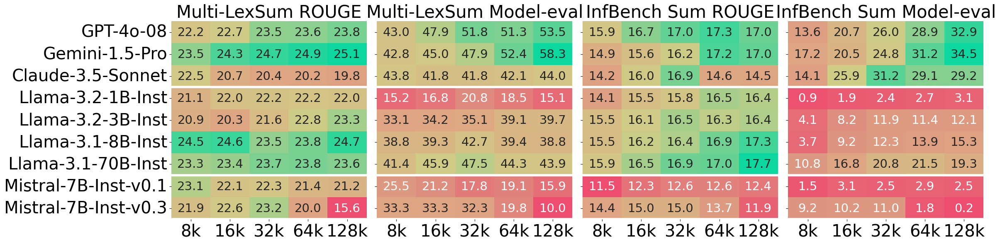

In [11]:
# plot specific ones in a row, for formatting in the paper
lf_df = process_df(all_df)
length_datasets = ["Multi-LexSum ROUGE", "Multi-LexSum", "InfBench Sum ROUGE", "InfBench Sum"]

ncols = 4
nrows = (len(length_datasets) - 1) // ncols + 1

fig, ax = plt.subplots(ncols=ncols, nrows=nrows, sharey=True, sharex=False)
fig.set_size_inches((ncols*6, nrows*6))

cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#ed4d6e", '#DD9380', '#DEA683', '#CFCC86', "#0CD79F"])

for i, dataset in enumerate(length_datasets):
    if nrows > 1:
        a = ax[i//ncols][i%ncols]
    else:
        a = ax[i]
    
    new_index = [
        "GPT-4o-08", 'Gemini-1.5-Pro', 'Claude-3.5-Sonnet', 
        'Llama-3.2-1B-Inst', 'Llama-3.2-3B-Inst', 'Llama-3.1-8B-Inst', 'Llama-3.1-70B-Inst',
        'Mistral-7B-Inst-v0.1', 'Mistral-7B-Inst-v0.3',
    ]

    tdf = lf_df[lf_df.input_max_length > 4096]
    tdf = tdf.pivot_table(index="Model", columns="input_max_length", values=dataset)
    tdf = tdf.reindex(new_index)
    
    sns_g = sns.heatmap(
        tdf, annot=True, cmap=cmap, fmt=".1f", yticklabels=True, 
        ax=a, annot_kws={"fontsize":21},
        cbar=False
    )
    sns_g.set_title(dataset + (" Model-eval" if "ROUGE" not in dataset and "F1" not in dataset else ""), fontsize=30)

    sns_g.set_ylabel("")
    sns_g.set_xlabel("")
    
    sns_g.set_yticklabels(tdf.index.tolist(), size=29)
    xticks = ['8k', '16k', '32k', '64k', '128k']
    sns_g.set_xticklabels(xticks, size = 29)
    for idx in [3, 7, 9, 12, 16]:
        a.axhline(y=idx, color="white", linestyle="-", linewidth=4)


[fig.delaxes(a) for a in ax.flatten() if not a.has_data()]

plt.tight_layout()
plt.savefig(f"figures/results_length_model_eval.pdf", dpi=500, format="pdf")
plt.show()

### Figure 7: select inst models on NIAH/RAG/Re-rank/Cite

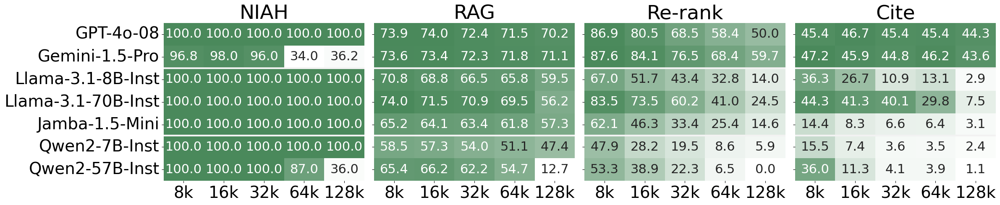

In [12]:
# plot specific ones in a row, for formatting in the paper
lf_df = process_df(all_df)
length_datasets = ["NIAH", "RAG", "Re-rank", "Cite"]

ncols = 4
nrows = (len(length_datasets) - 1) // ncols + 1

custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['#FFFFFF', '#4A895B'])
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, sharey=True, sharex=False)
fig.set_size_inches((ncols*6, nrows*5))
plt.rc('axes', unicode_minus=False)
plt.rcParams.update({'axes.unicode_minus' : False})

for i, dataset in enumerate(length_datasets):
    if nrows > 1:
        a = ax[i//ncols][i%ncols]
    else:
        a = ax[i]
    
    new_index = [
        'GPT-4o-08', 'Gemini-1.5-Pro',
        'Llama-3.1-8B-Inst', 'Llama-3.1-70B-Inst', 'Jamba-1.5-Mini',
        'Qwen2-7B-Inst', 'Qwen2-57B-Inst'
    ]

#     tdf = dataset_to_hm[dataset].reindex(new_index)
    tdf = lf_df[lf_df.input_max_length > 4096]
    tdf = tdf.pivot_table(index="Model", columns="input_max_length", values=dataset)
    tdf = tdf.reindex(new_index)
    
    sns_g = sns.heatmap(
        tdf, annot=True, cmap=custom_cmap, fmt=".1f", yticklabels=True, 
        ax=a, annot_kws={"fontsize":22},
        cbar=False
    )
    sns_g.set_title(dataset, fontsize=34)

    sns_g.set_ylabel("")
    sns_g.set_xlabel("")

#     a.set_yticklabels(ax[0].get_yticklabels() if (i%ncols) == 0 else [], size = 16)
#     sns_g.set_yticklabels(sns_g.get_yticklabels(), size = 16)
#     sns_g.set_xticklabels(sns_g.get_xticklabels(), size = 24)
    
    sns_g.set_yticklabels(new_index, size=28)
    xticks = ['8k', '16k', '32k', '64k', '128k']
    sns_g.set_xticklabels(xticks, size = 28)
    
    # idx, start, end
    a.hlines([2, 5, ], 0, 6, color="0.95", linestyle="-", linewidth=3)
#     a.vlines([5, 1, 3], [0, 5, 7], [5, 7, 11], color="bisque", linestyle="--", linewidth=3)

[fig.delaxes(a) for a in ax.flatten() if not a.has_data()]

plt.tight_layout()
plt.savefig(f"figures/results_length_select.pdf", dpi=500, format="pdf")
plt.show()

### Figure 6: Main results table with select instruct models

In [30]:
main_table_models = [
    'GPT-4',
    'GPT-4o-05',
    'GPT-4o-08',
    'GPT-4o-mini',
    'Claude-3.5-Sonnet',
    'Gemini-1.5-Flash',
    'Gemini-1.5-Pro',
    'Llama-3.1-8B-Inst',
    'Llama-3.1-70B-Inst',
    'Llama-3.3-70B-Inst',
    'Mistral-Nemo-Inst',
    'MegaBeam-Mistral',
    'Ministral-8B-Inst',
    'Phi-3-mini-128k-Inst',
    'Phi-3-small-128k-Inst',
    'Phi-3-med-128k-Inst',
    'Phi-3.5-mini-Inst',
    'Qwen2.5-72B-Inst',
    'Qwen2.5-7B-Inst-1M',
    'Qwen2.5-14B-Inst-1M',
    'Jamba-1.5-Mini',
    "ProLong",
]
main_table_datasets = ["Recall", 'RAG', "Cite", 'Re-rank', "LongQA", "Summ", 'ICL', "Ours"]

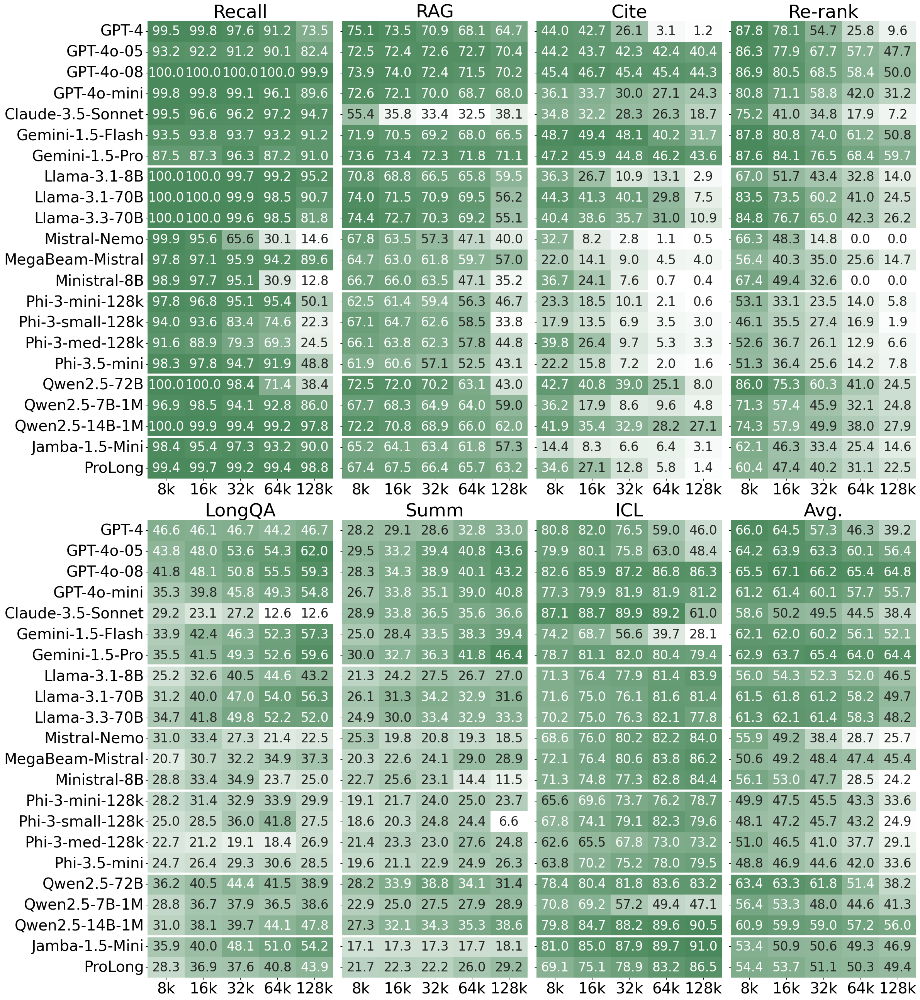

In [40]:
# plot specific ones in a row, for formatting in the paper
lf_df = process_df(all_df)
length_datasets = main_table_datasets

ncols = 4
nrows = (len(length_datasets) - 1) // ncols + 1

custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['#FFFFFF', '#4A895B'])
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, sharey=True, sharex=False)
fig.set_size_inches((ncols*6, 26))

plt.rc('axes', unicode_minus=False)
plt.rcParams.update({'axes.unicode_minus' : False})

for i, dataset in enumerate(length_datasets):
    if nrows > 1:
        a = ax[i//ncols][i%ncols]
    else:
        a = ax[i]
    
    new_index = main_table_models

    tdf = lf_df[lf_df.input_max_length > 4096]
    tdf = tdf.pivot_table(index="Model", columns="input_max_length", values=dataset)
    tdf = tdf.reindex(new_index)
    
    sns_g = sns.heatmap(
        tdf, annot=True, cmap=custom_cmap, fmt=".1f", yticklabels=True, 
        ax=a, annot_kws={"fontsize":23.5},
        cbar=False
    )
    sns_g.set_title(dataset if dataset != "Ours" else "Avg.", fontsize=34)

    sns_g.set_ylabel("")
    sns_g.set_xlabel("")

    new_index = [x.replace("-Inst", '') for x in new_index]
    sns_g.set_yticklabels(new_index, size=28)

    xticks = ['8k', '16k', '32k', '64k', '128k']
    sns_g.set_xticklabels(xticks, size = 28)
    
    for idx in [7, 10, 13, 17, 20, ]:
        a.axhline(y=idx, color="white", linestyle="-", linewidth=4)

[fig.delaxes(a) for a in ax.flatten() if not a.has_data()]

plt.tight_layout()
plt.savefig(f"figures/results_length_main.pdf", dpi=500, format="pdf")
plt.show()

### Figure 10: Appendix table with all categories and most models

In [36]:
full_table_models = [
    'GPT-4',
    'GPT-4o-05',
    'GPT-4o-08',
    'GPT-4o-mini',
    'Claude-3.5-Sonnet',
    'Gemini-1.5-Flash',
    'Gemini-1.5-Pro',
    'Llama-3-8B-θ',
    'Llama-3-8B-Inst-θ',
    'Llama-3-70B-θ',
    'Llama-3-70B-Inst-θ',
    'Llama-3.1-8B',
    'Llama-3.1-8B-Inst',
    'Llama-3.1-70B',
    'Llama-3.1-70B-Inst',
    'Llama-3.2-1B',
    'Llama-3.2-1B-Inst',
    'Llama-3.2-3B',
    'Llama-3.2-3B-Inst',
    'Llama-7B-80k',
    'Yarn-Llama-2-7B-128k',
    'Mistral-7B-Inst-v0.1',
    'Mistral-7B-Inst-v0.2',
    'Mistral-7B-v0.3',
    'Mistral-7B-Inst-v0.3',
    'Mistral-Nemo-Inst',
    'MegaBeam-Mistral',
    'Ministral-8B-Inst',
    'Phi-3-mini-128k-Inst',
    'Phi-3-small-128k-Inst',
    'Phi-3-med-128k-Inst',
    'Phi-3.5-mini-Inst',
    'Yi-6B-200k',
    'Yi-9B-200k',
    'Yi-34B-200k',
    'Qwen2-7B-Inst',
    'Qwen2-57B-Inst',
    'Qwen2.5-7B-Inst',
    'Qwen2.5-72B-Inst',
    'Qwen2.5-7B-Inst',
    'Qwen2.5-72B-Inst',
    'Qwen2.5-7B-Inst-1M',
    'Qwen2.5-14B-Inst-1M',
    'Jamba-1.5-Mini',
    "ProLong",
]

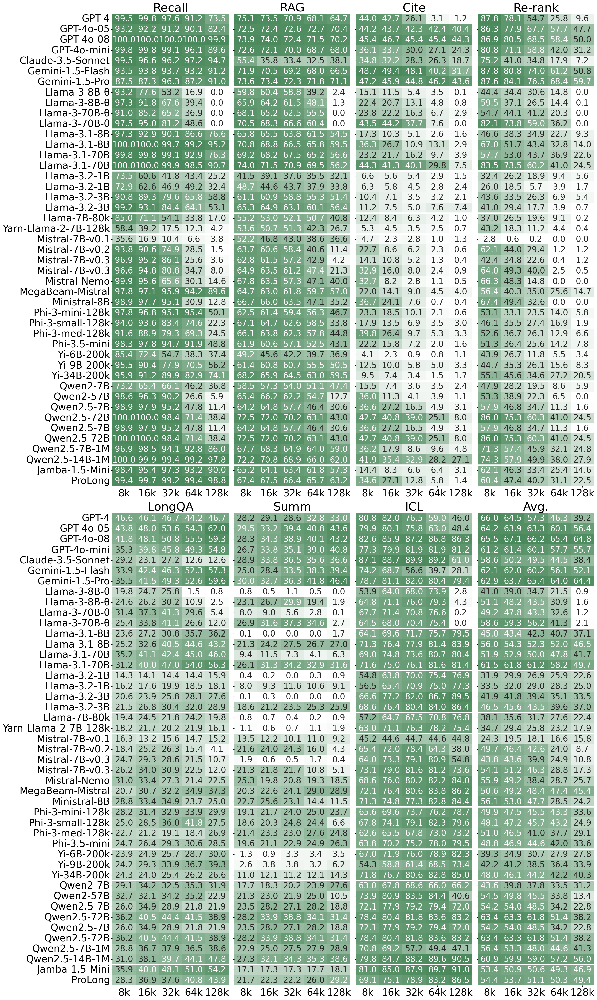

In [39]:
# plot specific ones in a row, for formatting in the paper
lf_df = process_df(all_df)
length_datasets = main_table_datasets

ncols = 4
nrows = (len(length_datasets) - 1) // ncols + 1
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['#FFFFFF', '#4A895B'])

fig, ax = plt.subplots(ncols=ncols, nrows=nrows, sharey=True, sharex=False)
fig.set_size_inches((ncols*6, 40))

plt.rc('axes', unicode_minus=False)
plt.rcParams.update({'axes.unicode_minus' : False})

for i, dataset in enumerate(length_datasets):
    if nrows > 1:
        a = ax[i//ncols][i%ncols]
    else:
        a = ax[i]
    
    new_index = full_table_models

    tdf = lf_df[lf_df.input_max_length > 4096]
    tdf = tdf.pivot_table(index="Model", columns="input_max_length", values=dataset)
    tdf = tdf.reindex(new_index)
    
    sns_g = sns.heatmap(
        tdf, annot=True, cmap=custom_cmap, fmt=".1f", yticklabels=True, 
        ax=a, annot_kws={"fontsize":23.5},
        cbar=False
    )
    sns_g.set_title(dataset if dataset != "Ours" else "Avg.", fontsize=34)

    sns_g.set_ylabel("")
    sns_g.set_xlabel("")

    new_index = [x.replace("-Inst", '') for x in new_index]
    sns_g.set_yticklabels(new_index, size=28)

    xticks = ['8k', '16k', '32k', '64k', '128k']
    sns_g.set_xticklabels(xticks, size = 28)
    
    for idx in [7, 11, 15, 19, 21, 28, 32, 35, 43]:
        a.axhline(y=idx, color="white", linestyle="-", linewidth=4)
    
[fig.delaxes(a) for a in ax.flatten() if not a.has_data()]

plt.tight_layout()
plt.savefig(f"figures/results_length_full.pdf", dpi=500, format="pdf")
plt.show()

## correlation-with-one

Here we plot the correlation of multiple datasets against one task.

[back](#table-of-content)

### Figure 4: InfBench QA vs. NIAH/RULER MK/HotpotQA

length = 131072 | dataset = NIAH
length = 131072 | dataset = NIAH MK Needle
length = 131072 | dataset = HotpotQA
figures/correlation_syn_longqa_dist_inst.pdf


/tmp/ipykernel_3149003/1540202921.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), size = 20)
/tmp/ipykernel_3149003/1540202921.py:34: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), size = 20)


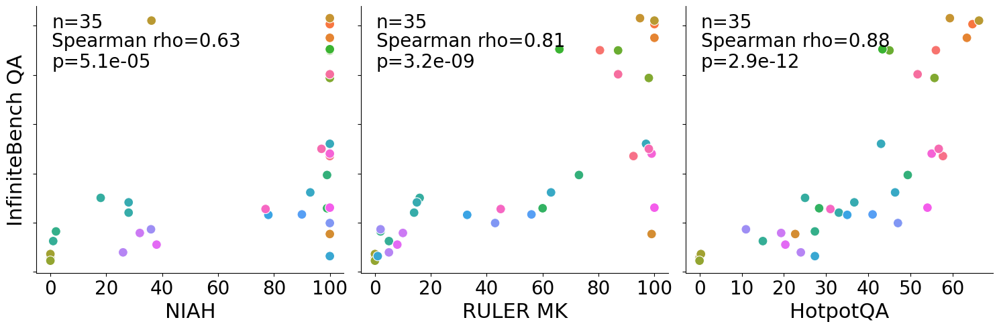

In [41]:
instruct_models = [x['model'] for x in models_configs if x.get("use_chat_template", True)]
lf_df = process_df(all_df, chosen_models=instruct_models)
dname = "InfBench QA"
melted_df = lf_df.melt(id_vars=['input_max_length', "Model", dname])

# plot correlation across datasets and lengths with one specific dataset
tdf = melted_df[melted_df.input_max_length==131072]
# tdf = tdf[tdf.dataset_simple.isin(['NIAH S Essay', 'NIAH MK Needle', 'HotpotQA'])]
g = sns.relplot(
    tdf.rename({"input_max_length": "length", "dataset_simple": "dataset"}, axis=1), 
    x="value", y=dname, row="length", col="dataset", 
    facet_kws={'sharey': True, 'sharex': False},
    hue="Model", markers=True, legend=False, col_order=['NIAH', 'NIAH MK Needle', 'HotpotQA'],
    s=100,
)


def annotate(data, **kws):
    data = data[data["value"].notna() & data[dname].notna()]
    ax = plt.gca()
    if len(data) > 1:
        ax.text(.05, .92, 'n={}'.format(len(data)), transform=ax.transAxes, fontsize=20)
        rho, p = stats.spearmanr(data['value'], data[dname])
        ax.text(.05, .85, 'Spearman rho={:.2f}'.format(rho), transform=ax.transAxes, fontsize=20)
        ax.text(.05, .77, 'p={:.2g}'.format(p), transform=ax.transAxes, fontsize=20)
    print(ax.get_title())
    dataset = ax.get_title().split("= ")[-1]
    if dataset == "NIAH MK Needle":
        dataset = "RULER MK"
    ax.set_title("")
    ax.set_xlabel(dataset, fontsize=22)
    ax.set_ylabel("InfiniteBench QA", fontsize=22)
    ax.set_yticklabels(ax.get_yticklabels(), size = 20)
    ax.set_xticklabels(ax.get_xticklabels(), size = 20)

g.map_dataframe(annotate)
# g.fig.suptitle(f"Correlation with {dname}", fontsize=24, y=1.05)
plt.tight_layout()
fname = "figures/correlation_syn_longqa_dist_inst.pdf"
print(fname)
plt.savefig(fname, dpi=300, format="pdf")
plt.show()

## pairwise-correlation
[back](#table-of-content)

### Figure 3: Correlation between select synthetic tasks and real categories

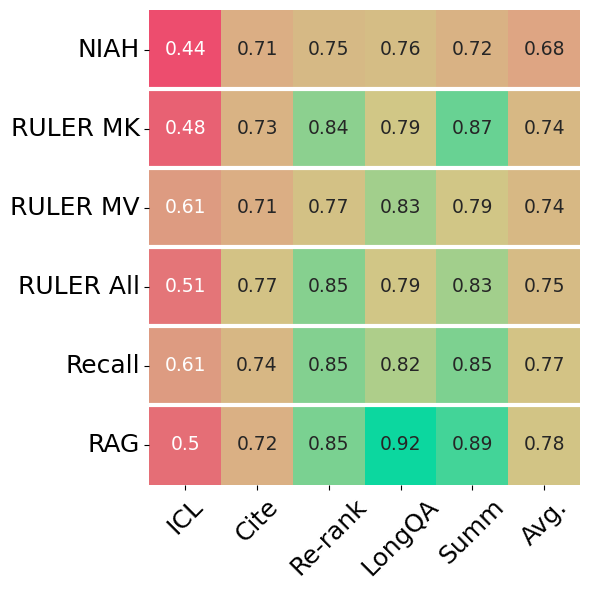

In [42]:
# break into different lengths and then plot the pairwise heatmap

lf_df = process_df(all_df, instruct_models)
# synthetic analysis
datasets2 = [
    'ICL', 'Cite', 'Re-rank', 'LongQA', 'Summ'
]
datasets1 = ['NIAH', 'NIAH MK Needle', 'NIAH MV', 'RULER', 'Recall', 'RAG']

cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#ed4d6e", '#DD9380', '#DEA683', '#CFCC86', "#0CD79F"])

all_corr = {}
lengths = [131072]
fig, ax = plt.subplots(figsize=(6, 6), nrows=1, ncols=len(lengths))

for i, (l, d) in enumerate(lf_df.groupby("input_max_length", sort=False)):
    if l not in lengths:
        continue
    i = lengths.index(l)
    pearsons = []
    spearmans = []
    kendalls = []
    for d1 in datasets1:
        for d2 in datasets2:
            x = d[d[d1].notnull() & d[d2].notnull()]
            m1 = x[d1]
            m2 = x[d2]

            if len(m1) < 2 and len(m2) < 2:
                continue
            
            rho, p = stats.spearmanr(m1, m2)
            spearmans.append({"dataset 1": d1, "dataset 2": d2, "correlation": rho})
    
    all_corr[l] = {"spearman": pd.DataFrame(spearmans)}
    for j, (name, table) in enumerate(all_corr[l].items()):
        hm = table.pivot_table(index="dataset 1", columns="dataset 2", values="correlation", sort=False)
        a = ax[i] if len(lengths) > 1 else ax
        hm["Avg."] = hm.mean(axis=1)
        sns_g = sns.heatmap(hm, annot=True, ax=a, cbar=False, cmap=cmap, annot_kws={"fontsize": 13.5})
       
        sns_g.set_ylabel("")
        sns_g.set_xlabel("")

        ylabels = [d.replace("NIAH ", "RULER ") for d in datasets1]
        sns_g.set_yticklabels(ylabels, size = 18)
        sns_g.set_xticklabels(sns_g.get_xticklabels(), size = 18)

        a.tick_params(axis='x', rotation=45)
        a.tick_params(axis='y', rotation=0) 
        
        sns_g.set_yticklabels(["NIAH", "RULER MK", "RULER MV", "RULER All", "Recall", "RAG"], size = 18)            
        for idx in [1,2,3,4,5]:
            a.axhline(idx, color="white", linestyle="-", linewidth=3)
            
plt.tight_layout()
plt.savefig("figures/correlation_syn_real_inst.pdf", dpi=300, format="pdf")
plt.show()

### Figure 8: All synthetic and RAG vs. other real tasks (Appendix)

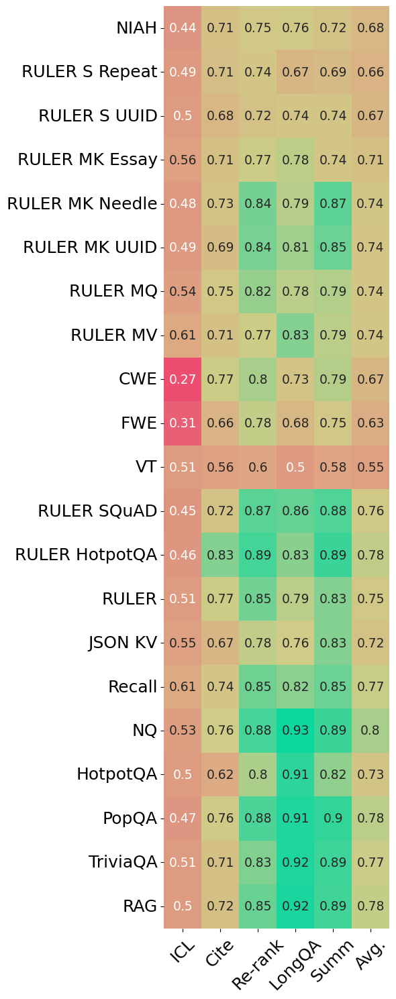

In [43]:
# break into different lengths and then plot the pairwise heatmap
lf_df = process_df(all_df, chosen_models=instruct_models)

cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#ed4d6e", '#DD9380', '#DEA683', '#CFCC86', "#0CD79F"])
datasets2 = ['ICL', 'Cite', 'Re-rank', 'LongQA', 'Summ']
datasets1 = ['NIAH', 'NIAH S Repeat', 'NIAH S UUID', 'NIAH MK Essay', 'NIAH MK Needle', 'NIAH MK UUID', 'NIAH MQ', 'NIAH MV', 'CWE', 'FWE', 'VT', 'RULER SQuAD', 'RULER HotpotQA', 'RULER', 'JSON KV', 'Recall', 'NQ', 'HotpotQA', 'PopQA', 'TriviaQA', 'RAG']

all_corr = {}
lengths = [131072]
fig, ax = plt.subplots(figsize=(6, 15), nrows=1, ncols=len(lengths))

for i, (l, d) in enumerate(lf_df.groupby("input_max_length", sort=False)):
    if l not in lengths:
        continue
    i = lengths.index(l)
    pearsons = []
    spearmans = []
    kendalls = []
    for d1 in datasets1:
        for d2 in datasets2:
            x = d[d[d1].notnull() & d[d2].notnull()]
            m1 = x[d1]
            m2 = x[d2]

            if len(m1) < 2 and len(m2) < 2:
                continue
            
            rho, p = stats.spearmanr(m1, m2)
            spearmans.append({"dataset 1": d1, "dataset 2": d2, "correlation": rho})
    
    all_corr[l] = {"spearman": pd.DataFrame(spearmans)}
    for j, (name, table) in enumerate(all_corr[l].items()):
        hm = table.pivot_table(index="dataset 1", columns="dataset 2", values="correlation", sort=False)
        a = ax[i] if len(lengths) > 1 else ax
        hm["Avg."] = hm.mean(axis=1)
        sns_g = sns.heatmap(hm, annot=True, ax=a, cbar=False, cmap=cmap, annot_kws={"fontsize": 13.5})
        
        sns_g.set_ylabel("")
        sns_g.set_xlabel("")

        ylabels = [d.replace("NIAH ", "RULER ") for d in datasets1]
        sns_g.set_yticklabels(ylabels, size = 18)
        sns_g.set_xticklabels(sns_g.get_xticklabels(), size = 18)

        a.tick_params(axis='x', rotation=45)
        a.tick_params(axis='y', rotation=0) 
            
plt.tight_layout()
plt.savefig("figures/correlation_syn_real_full_inst.pdf", dpi=300, format="pdf")
plt.show()

### Figure 5: All categories vs. all categories

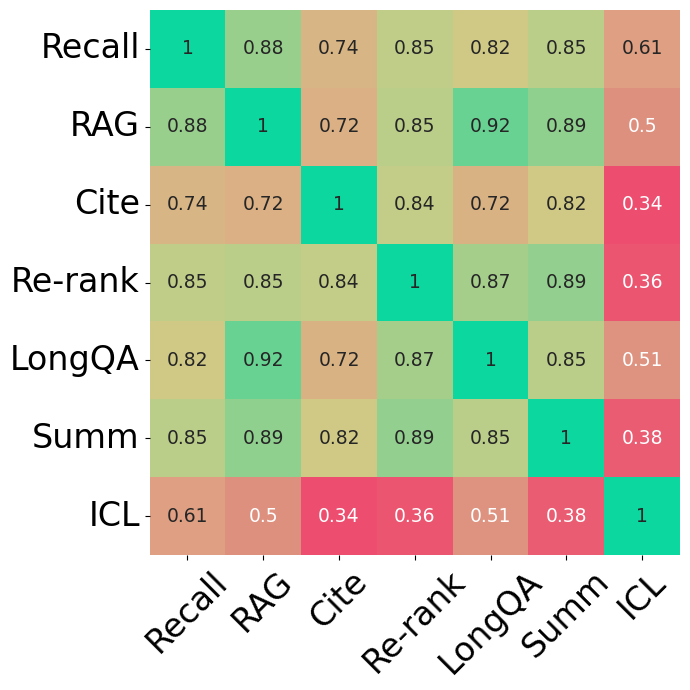

In [51]:
# break into different lengths and then plot the pairwise heatmap

datasets = ['JSON KV', 'NIAH MK Needle', 'NIAH MK UUID', 'NIAH MV', 'Recall', 'NQ', 'HotpotQA', 'PopQA', 'TriviaQA', 'RAG', 'ALCE ASQA Correctness', 'ALCE ASQA Cite Recall', 'ALCE ASQA Cite Precision', 'QAMPARI Correctness', 'QAMPARI Cite Recall', 'QAMPARI Cite Precision', 'Cite', 'MSMARCO', 'NarrativeQA', 'InfBench QA', 'InfBench MC', 'LongQA', 'InfBench Sum', 'Multi-LexSum', 'Summ', 'TREC Coarse', 'TREC Fine', 'BANKING77', 'CLINIC150', 'NLU', 'ICL', 'Ours']
datasets = ['Recall', 'RAG', 'Cite', 'Re-rank', 'LongQA', 'Summ', 'ICL']

datasets1, datasets2 = datasets, datasets

cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#ed4d6e", '#DD9380', '#DEA683', '#CFCC86', "#0CD79F"])

all_corr = {}
lengths = [131072]
fig, ax = plt.subplots(figsize=(len(datasets), len(datasets)), nrows=1, ncols=len(lengths))

for i, (l, d) in enumerate(lf_df.groupby("input_max_length", sort=False)):
    if l not in lengths:
        continue
    i = lengths.index(l)
    pearsons = []
    spearmans = []
    kendalls = []
    for d1 in datasets1:
        for d2 in datasets2:
            x = d[d[d1].notnull() & d[d2].notnull()]
            m1 = x[d1]
            m2 = x[d2]

            if len(m1) < 2 and len(m2) < 2:
                continue
            
            rho, p = stats.spearmanr(m1, m2)
            spearmans.append({"dataset 1": d1, "dataset 2": d2, "correlation": rho})
    
    all_corr[l] = {"spearman": pd.DataFrame(spearmans)}
    for j, (name, table) in enumerate(all_corr[l].items()):
        hm = table.pivot_table(index="dataset 1", columns="dataset 2", values="correlation", sort=False)
        a = ax[i] if len(lengths) > 1 else ax
        sns_g = sns.heatmap(hm, annot=True, ax=a, cbar=False, cmap=cmap, annot_kws={"fontsize": 13.5})
        
        sns_g.set_ylabel("")
        sns_g.set_xlabel("")
        
        t = [x.replace("ALCE ", "") for x in datasets]
        sns_g.set_yticklabels(t, size = 24)
        sns_g.set_xticklabels(t, size = 24)
            
        a.tick_params(axis='x', rotation=45)
        a.tick_params(axis='y', rotation=0) 

plt.tight_layout()
plt.savefig("figures/correlation_category_inst.pdf", dpi=300, format="pdf")
plt.show()

### Figure 9: All task vs. all task correlation (Appendix)

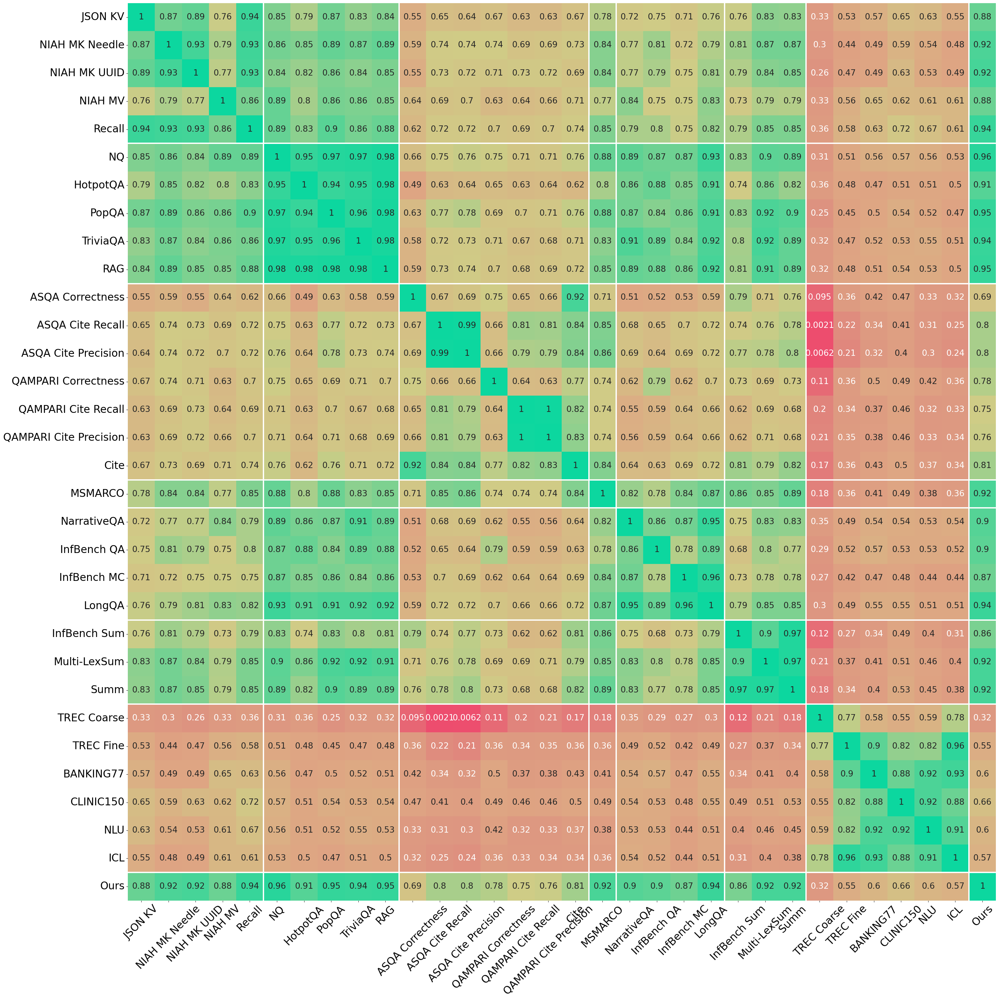

In [52]:
# break into different lengths and then plot the pairwise heatmap
lf_df = process_df(all_df, instruct_models)
datasets = ['JSON KV', 'NIAH MK Needle', 'NIAH MK UUID', 'NIAH MV', 'Recall', 'NQ', 'HotpotQA', 'PopQA', 'TriviaQA', 'RAG', 'ALCE ASQA Correctness', 'ALCE ASQA Cite Recall', 'ALCE ASQA Cite Precision', 'QAMPARI Correctness', 'QAMPARI Cite Recall', 'QAMPARI Cite Precision', 'Cite', 'MSMARCO', 'NarrativeQA', 'InfBench QA', 'InfBench MC', 'LongQA', 'InfBench Sum', 'Multi-LexSum', 'Summ', 'TREC Coarse', 'TREC Fine', 'BANKING77', 'CLINIC150', 'NLU', 'ICL', 'Ours']
datasets1, datasets2 = datasets, datasets

cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#ed4d6e", '#DD9380', '#DEA683', '#CFCC86', "#0CD79F"])

all_corr = {}
lengths = [131072]
fig, ax = plt.subplots(figsize=(len(datasets), len(datasets)), nrows=1, ncols=len(lengths))

for i, (l, d) in enumerate(lf_df.groupby("input_max_length", sort=False)):
    if l not in lengths:
        continue
    i = lengths.index(l)
    pearsons = []
    spearmans = []
    kendalls = []
    for d1 in datasets1:
        for d2 in datasets2:
            x = d[d[d1].notnull() & d[d2].notnull()]
            m1 = x[d1]
            m2 = x[d2]

            if len(m1) < 2 and len(m2) < 2:
                continue
            
            rho, p = stats.spearmanr(m1, m2)
            spearmans.append({"dataset 1": d1, "dataset 2": d2, "correlation": rho})
    
    all_corr[l] = {"spearman": pd.DataFrame(spearmans)}
    for j, (name, table) in enumerate(all_corr[l].items()):
        
        hm = table.pivot_table(index="dataset 1", columns="dataset 2", values="correlation", sort=False)
        a = ax[i] if len(lengths) > 1 else ax
        sns_g = sns.heatmap(hm, annot=True, ax=a, cbar=False, cmap=cmap, annot_kws={"fontsize": 19})
        
        sns_g.set_ylabel("")
        sns_g.set_xlabel("")
        
        t = [x.replace("ALCE ", "") for x in datasets]
        sns_g.set_yticklabels(t, size = 24)
        sns_g.set_xticklabels(t, size = 24)
            
        a.tick_params(axis='x', rotation=45)
        a.tick_params(axis='y', rotation=0) 

        for idx in [5, 10, 17, 18, 22, 25, 31]:
            a.axvline(x=idx, color="white", linestyle="-", linewidth=3)
            a.axhline(y=idx, color="white", linestyle="-", linewidth=3)

plt.tight_layout()
plt.savefig("figures/correlation_category_full_inst.pdf", dpi=300, format="pdf")
plt.show()

## heatmap-by-depth
[back](#table-of-content)

checking: output/gpt-4-0125-preview/json_kv_v1_test_k50_dep6_in4096_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
checking: output/gpt-4-0125-preview/json_kv_v1_test_k105_dep6_in8192_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
good
checking: output/gpt-4-0125-preview/json_kv_v1_test_k220_dep6_in16384_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
good
checking: output/gpt-4-0125-preview/json_kv_v1_test_k440_dep6_in32768_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
good
checking: output/gpt-4-0125-preview/json_kv_v1_test_k900_dep6_in65536_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
good
checking: output/gpt-4-0125-preview/json_kv_v1_test_k1800_dep6_in131072_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
good
checking: output/gpt-4o-mini-2024-07-18/json_kv_v1_test_k50_dep6_in4096_size100_shots2_sampFalsemax100min0t0.0p1.0_chatTrue_42.json
checking: output/gpt-4o-mini-2024-07-18/json_kv_v1_test_k105_dep

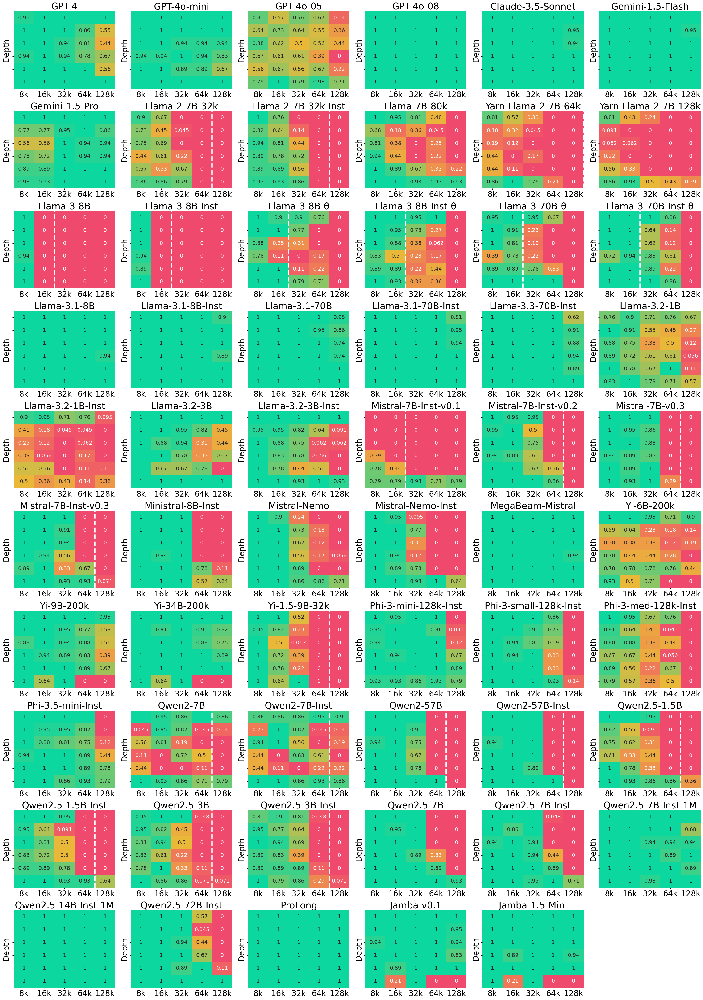

In [55]:
# plot the heatmap by depth for each model, note that this takes quite some time to generate...

datasets_configs = [
    {"dataset": "json_kv", "test_name": "test_k50_dep6", "max_test_samples": 100, "generation_max_length": 100, "input_max_length": 4096, "category": "synthetic", "use_chat_template": False, "shots": 2},
    {"dataset": "json_kv", "test_name": "test_k105_dep6", "input_max_length": 8192},
    {"dataset": "json_kv", "test_name": "test_k220_dep6", "input_max_length": 16384},
    {"dataset": "json_kv", "test_name": "test_k440_dep6", "input_max_length": 32768},
    {"dataset": "json_kv", "test_name": "test_k900_dep6", "input_max_length": 65536},
    {"dataset": "json_kv", "test_name": "test_k1800_dep6", "input_max_length": 131072},

    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k20_dep6", "input_max_length": 4096, "max_test_samples": 100, "generation_max_length": 20, "shots": 2, "category": "odqa", "use_chat_template": False},
    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k50_dep6", "input_max_length": 8192},
    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k105_dep6", "input_max_length": 16384},
    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k220_dep6", "input_max_length": 32768},
    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k440_dep6", "input_max_length": 65536},
    # {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k1000_dep6", "input_max_length": 131072},
    
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k20_dep6", "input_max_length": 4096, "max_test_samples": 100, "generation_max_length": 20, "category": "odqa", "use_chat_template": False},
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k50_dep6", "input_max_length": 8192},
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k105_dep6", "input_max_length": 16384},
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k220_dep6", "input_max_length": 32768},
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k440_dep6", "input_max_length": 65536},
    # {"dataset": "kilt_popqa_3", "test_name": "popqa_test_1000_k1000_dep6", "input_max_length": 131072},
    
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k20_dep6", "input_max_length": 4096, "max_test_samples": 100, "generation_max_length": 20, "category": "odqa", "use_chat_template": False},
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k50_dep6", "input_max_length": 8192},
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k105_dep6", "input_max_length": 16384},
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k220_dep6", "input_max_length": 32768},
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k440_dep6", "input_max_length": 65536},
    # {"dataset": "kilt_triviaqa", "test_name": "triviaqa-dev-multikilt_1000_k1000_dep6", "input_max_length": 131072},
]

depth_dfs = []
ncols = 6

for i, model in enumerate(models_configs):
    args = arguments()
    depths = []
    for dataset in datasets_configs:
        args.update(dataset)
        args.update(model)

        depth = args.get_metric_by_depth()
        if depth is None:
            continue
        for d in depth:
            d["input_length"] = args.input_max_length
            d["depth"] = math.ceil(d["depth"] * 10) / 10
        depths += depth
        print('good')
    if len(depths) == 0:
        continue
    depths = pd.DataFrame(depths)
    depth_dfs.append((model, depths))

fig, ax = plt.subplots(nrows=(len(depth_dfs)-1) // ncols + 1, ncols=ncols, sharey=True, sharex=False)
fig.set_size_inches((ncols*5, len(ax)*4.25))
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#F0496E", "#EBB839", "#0CD79F"])

vmin = min([d[1]['metric'].min() for d in depth_dfs])
vmax = max([d[1]['metric'].max() for d in depth_dfs])
for i, (config, depths) in enumerate(depth_dfs):
    a = ax[i//ncols][i%ncols]
    pivot_table = depths.pivot(index="depth", columns="input_length", values="metric")
    sns_g = sns.heatmap(
        pivot_table, cmap=cmap, vmin=vmin, vmax=vmax, cbar_kws={"label": "Score"}, ax=a, annot=True,
        cbar=False, annot_kws={"fontsize": 16}
    )
    m = config['model']
    
    idx = {'8k': 1, '16k': 2, '32k': 3, '64k': 4, '80k': 4}.get(model_lengths[model_name_replace[config['model']]], 5)
    a.axvline(idx+1, color="white", linestyle="--", linewidth=4)

    sns_g.set_title(model_name_replace.get(m, m), fontsize=28)
    xticks = {'4096': '4k', '8192': '8k', '16384': '16k', '32768': '32k', '65536': '64k', '131072': '128k'}
    xticks = [xticks[x.get_text()] for x in a.get_xticklabels()]
    a.set_xticklabels(xticks, size=24)
    a.set_yticklabels(a.get_yticklabels(), size=24)
    a.set_ylabel("Depth", size=24)
    a.set_xlabel("")

[fig.delaxes(a) for i, a in enumerate(ax.flatten()) if not a.has_data()]
plt.tight_layout()
plt.savefig("figures/depths_json_kv.pdf", dpi=300, format="pdf")
plt.show()

## Misc

### infinite-bench
[back](#table-of-content)

In [56]:
models=[
    "gpt-4-0125-preview",
    "gpt-4o-2024-05-13",
    "gpt-4o-2024-08-06",
    "gpt-4o-mini-2024-07-18",
    "gemini-1.5-flash-001",
    "gemini-1.5-pro-001",
    "Meta-Llama-3.1-8B",
    "Meta-Llama-3.1-8B-Instruct",
    "Meta-Llama-3.1-70B",
    "Meta-Llama-3.1-70B-Instruct",
    "Llama-3.2-1B",
    "Llama-3.2-1B-Instruct",
    "Llama-3.2-3B",
    "Llama-3.2-3B-Instruct",
]

tasks = ["longbook_choice_eng", "longbook_qa_eng", "longbook_sum_eng", "longdialogue_qa_eng", "math_calc", "math_find", "number_string", "passkey", "kv_retrieval"]

output = []
for m in models:
    for t in tasks:
        fname = f"/scratch/gpfs/hyen/InfiniteBench/results/{m}/preds_{t}.jsonl.score"
        if not os.path.exists(fname):
            print(fname)
            continue
        with open(fname) as f:
            s = json.load(f)["score"]*100
            output.append({'model': m.replace("Meta-", ""), "task": t, "score": s})

infdf = pd.DataFrame(output)
infdf = infdf.replace(model_name_replace)
infdf = infdf.pivot_table(index=["model"], columns="task", values="score", sort=False)
infdf["avg"] = infdf[infdf.columns[1:]].mean(axis=1)

inf_avg_numbers = {x: y['avg'] for x, y in infdf.iterrows()}
print(infdf.to_latex(float_format="{:.1f}".format))

\begin{tabular}{lrrrrrrrrrr}
\toprule
task &  longbook\_choice\_eng &  longbook\_qa\_eng &  longbook\_sum\_eng &  longdialogue\_qa\_eng &  math\_calc &  math\_find &  number\_string &  passkey &  kv\_retrieval &  avg \\
model              &                      &                  &                   &                      &            &            &                &          &               &      \\
\midrule
GPT-4              &                 75.9 &             23.7 &              10.7 &                 18.5 &        0.0 &       47.1 &          100.0 &    100.0 &          58.8 & 44.9 \\
GPT-4o-05          &                 88.2 &             37.9 &              23.7 &                 28.5 &        0.0 &       58.6 &          100.0 &    100.0 &          94.2 & 55.4 \\
GPT-4o-08          &                 86.5 &             26.0 &              21.5 &                 51.0 &        0.0 &       58.9 &          100.0 &    100.0 &          99.8 & 57.1 \\
GPT-4o-mini        &               

/tmp/ipykernel_3149003/1183742785.py:37: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(infdf.to_latex(float_format="{:.1f}".format))


In [57]:
print(infdf.to_csv())

model,longbook_choice_eng,longbook_qa_eng,longbook_sum_eng,longdialogue_qa_eng,math_calc,math_find,number_string,passkey,kv_retrieval,avg
GPT-4,75.87719298245614,23.722776955642143,10.704063733918801,18.5,0.0013334222281485431,47.14285714285714,100.0,100.0,58.8,44.85887890683078
GPT-4o-05,88.20960698689956,37.87719586769236,23.749623904661636,28.499999999999996,0.00026668444562970864,58.57142857142858,100.0,100.0,94.19999999999999,55.362314378528524
GPT-4o-08,86.46288209606988,25.993999506864796,21.47713144602294,51.0,0.00026668444562970864,58.857142857142854,100.0,100.0,99.8,57.14106756180953
GPT-4o-mini,78.16593886462883,19.065831730895045,24.822526207937923,21.5,0.0001851975316872977,69.71428571428572,100.0,100.0,80.4,51.9378536063313
Gemini-1.5-Flash,75.9825327510917,42.057959028013656,29.99918887808143,55.81395348837209,0.00026668444562970864,47.42857142857143,100.0,100.0,31.4,50.837492438435525
Gemini-1.5-Pro,77.45098039215686,27.68982829568296,28.976135586968475,97.4576271186440

### teaser-figure
[back](#table-of-content)

In [60]:
teaser_table_datasets = [
    'ruler_niah_s_2 ruler_recall',
    "RULER",
    "Ours",
]
teaser_table_models = [
    'Llama-3.1-8B-Instruct',
    'Llama-3.1-70B-Instruct',
    'gpt-4o-mini-2024-07-18',
    'gpt-4o-2024-08-06',
    'gemini-1.5-flash-001',
    'gemini-1.5-pro-001',
]


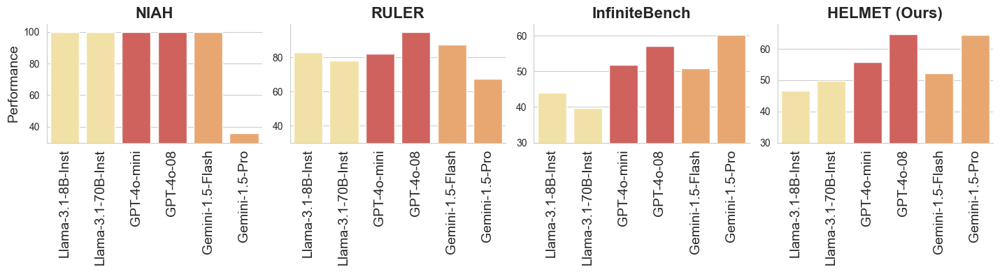

In [63]:
ldf = process_df(all_df, chosen_models=teaser_table_models, chosen_datasets=teaser_table_datasets)
ldf["InfiniteBench"] = ldf["Model"].map(inf_avg_numbers)
cols = [col for col in ldf.columns if col != 'Ours'] + ['Ours']
ldf = ldf[cols]
ldf = ldf.rename(columns={"Ours": "HELMET (Ours)"})

bar_df = ldf.melt(id_vars=['input_max_length', "Model"])
bar_df = bar_df[bar_df["input_max_length"] == 131072]

def fam(k):
    return "GPT4" if "gpt" in k.lower() else "Gemini 1.5" if "gemini" in k.lower() else "Llama 3.1" if "3.1" in k.lower() else "Llama 3.2" if "3.2" in k.lower() else "Qwen2"

bar_df["Family"] = bar_df["Model"].map(fam)

# sns.set(font_scale=1)
sns.set_style("whitegrid")

with sns.color_palette("Spectral"):
    g = sns.catplot(
        data=bar_df, x="Model", y="value", col="dataset_simple", row="input_max_length", hue="Family",
        kind="bar", height=4, aspect=0.9,
        sharey=False, dodge=False, legend=False,
        order=[model_name_replace.get(x, x) for x in teaser_table_models], 
    )
    
g.set_axis_labels("", "Performance", fontsize=14)
g.tick_params(axis='x', rotation=90)

g.set_titles("{col_name}", fontsize=42)

def annotate(data, **kws):
    ax = plt.gca()
    ax.set_ylim(bottom=30)
    if ax.get_title() == "NIAH Single":
        ax.set_ylim(top=100)
        print(ax.get_yticklabels())
        print("hihihi")
    labels = ax.get_xticklabels()
#     print(ax.get_title())
#     if ax.get_title() == "InfiniteBench":
#         for i in [0, 1]:
#             labels[i].set_fontweight('bold')
#     elif ax.get_title() == "RULER":
#         for i in [0, 1, 4, 5]:
#             labels[i].set_fontweight('bold')
#     elif ax.get_title() == 'NIAH Single':
#         labels[-1].set_fontweight('bold')
    ax.set_title(ax.get_title(), fontsize=16, fontweight='bold')
    ax.set_xticklabels(labels, fontsize=14)

g.map_dataframe(annotate)


# sns.move_legend(
#     g, "lower center",
#     bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False,
# )
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.savefig("figures/comparison_teaser.pdf", dpi=300, format="pdf")
plt.show()
# g.set(ylim=(0, 1))
# g.despine(left=True)
# sns.set(font_scale=1)

### infbench-variance
[back](#table-of-content)

In [569]:
models=[
    "gpt-4o-2024-05-13",
    "gpt-4o-2024-08-06",
    "gpt-4o-mini-2024-07-18",
    "gemini-1.5-flash-001",
    "gemini-1.5-pro-001",
]

tasks = ["longbook_choice_eng", "longbook_qa_eng"]

output = []
for seed, pf in [(42, ""), (43, "-1"), (44, "-2")]:
    for m in models:
        for t in tasks:
            fname = f"/scratch/gpfs/hyen/InfiniteBench/results/{m}{pf}/preds_{t}.jsonl.score"
            if not os.path.exists(fname):
                print(fname)
                continue
            with open(fname) as f:
                s = json.load(f)["all_scores"]
                random.seed(seed)
                s = random.sample(s, 100) if len(s) > 100 else s
                s = np.mean(s)*100
                output.append({'model': m, "task": t, "metric": s})

var_df = pd.DataFrame(output)
var_df_ = []
for (m, d), df_1 in var_df.groupby(["model", 'task']):
    var_df_.append({"model": m, "metric": f"{d} mean", "number": df_1.metric.mean()})
    var_df_.append({"model": m, "metric": f"{d} std", "number": df_1.metric.std()})
var_df = pd.DataFrame(var_df_)
var_df = var_df.pivot_table(index="model", columns="metric", values="number")
var_df

metric,longbook_choice_eng mean,longbook_choice_eng std,longbook_qa_eng mean,longbook_qa_eng std
model,,,,
gemini-1.5-flash-001,77.666667,8.020806,43.002458,0.769910
gemini-1.5-pro-001,79.333333,3.511885,27.750775,0.636954
gpt-4o-2024-05-13,86.000000,4.358899,38.232085,2.719435
gpt-4o-2024-08-06,85.333333,1.527525,25.076624,1.808485
gpt-4o-mini-2024-07-18,78.000000,1.732051,19.444877,0.373359


In [545]:
[m['model'] for m in models]

['gpt-4-0125-preview',
 'gpt-4o-mini-2024-07-18',
 'gpt-4o-2024-05-13',
 'gpt-4o-2024-08-06',
 'gemini-1.5-flash-001',
 'gemini-1.5-pro-001',
 'Meta-Llama-3.1-8B',
 'Meta-Llama-3.1-8B-Instruct',
 'Llama-3.2-1B',
 'Llama-3.2-1B-Instruct',
 'Llama-3.2-3B',
 'Llama-3.2-3B-Instruct']

In [17]:
datasets = [
    {"dataset": "json_kv", "test_name": "test_k1800_dep6", "input_max_length": 131072, "generation_max_length": 100, "use_chat_template": False},
    {"dataset": "kilt_nq", "test_name": "nq-dev-multikilt_1000_k1000_dep6", "input_max_length": 131072, "generation_max_length": 20, "use_chat_template": False},
    {"dataset": "msmarco_rerank_psg", "test_name": "test_reranking_data_k1000_dep3", "input_max_length": 131072, "generation_max_length": 200, "use_chat_template": False},
    {"dataset": "infbench_choice_eng_130862", "test_name": "", "input_max_length": 131072, "generation_max_length": 10, "use_chat_template": True},
    {"dataset": "infbench_qa_eng_130862", "test_name": "", "input_max_length": 131072, "generation_max_length": 10, "use_chat_template": True},
#     {"dataset": "infbench_sum_eng_129672", "test_name": "", "input_max_length": 131072, "generation_max_length": 1200, "use_chat_template": True},
#     {"dataset": "multi_lexsum_130372", "test_name": "", "input_max_length": 131072, "generation_max_length": 400, "use_chat_template": True},

#     {"dataset": "infbench_qa_eng_130862", "test_name": "", "input_max_length": 131072, "generation_max_length": 10},
#     {"dataset": "infbench_choice_eng_130862", "test_name": "", "input_max_length": 131072, "generation_max_length": 10},
]

models=[
    {"model": "gpt-4-0125-preview", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-mini-2024-07-18", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-2024-05-13", "use_chat_template": True, "training_length": 128000},
    {"model": "gpt-4o-2024-08-06", "use_chat_template": True, "training_length": 128000},
#     {"model": "claude-3-5-sonnet-20240620", "use_chat_template": True, "training_length": 200000},
    {"model": "gemini-1.5-flash-001", "use_chat_template": True, "training_length": 1048576},
    {"model": "gemini-1.5-pro-001", "use_chat_template": True, "training_length": 2097152},
    
    {"model": "Meta-Llama-3.1-8B", "use_chat_template": False, "training_length": 131072},
    {"model": "Meta-Llama-3.1-8B-Instruct", "training_length": 131072},
#     {"model": "Meta-Llama-3.1-70B", "use_chat_template": False, "training_length": 131072},
#     {"model": "Meta-Llama-3.1-70B-Instruct", "training_length": 131072},
    
    {"model": "Llama-3.2-1B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.2-1B-Instruct", "training_length": 131072},
    {"model": "Llama-3.2-3B", "use_chat_template": False, "training_length": 131072},
    {"model": "Llama-3.2-3B-Instruct", "training_length": 131072},
    
#     {"model": "Qwen2-7B", "use_chat_template": False, "training_length": 32768},
#     {"model": "Qwen2-7B-Instruct", "training_length": 32768},
]
for model in models:
    model["output_dir"] = f"output/{model['model']}"

var_df = []    
for shots in [0, 2]:
    for seed in [42, 43, 44]:
        for midx, model in enumerate(models):
            args = arguments()

            for dataset in datasets:
                args.update(dataset)
                args.update(model)
                args.seed = seed
                args.shots = shots

                metric = args.get_averaged_metric()
                dsimple, mnames = args.get_metric_name()

                if metric is None:
                    continue

                for k, m in metric.items():
                    var_df.append({**asdict(args), **model,
                        "metric name": k, "metric": m, 
                        "dataset_simple": dsimple + f" {k} {shots}-shot",
                        "seed": seed, "shots": shots,
                    })

var_df = pd.DataFrame(var_df)
display(var_df)
var_df_ = []
for (m, d), df_1 in var_df.groupby(["model", 'dataset_simple'], sort=False):
    print(f"{m} {d} {df_1.metric.mean():.1f} {df_1.metric.std():.1f}")
    var_df_.append({"model": m, "metric": f"{d}", "number": f"${df_1.metric.mean():.1f}_{{{df_1.metric.std():.1f}}}$"})
#     var_df_.append({"model": m, "metric": f"{d}", "number": df_1.metric.mean()})
#     var_df_.append({"model": m, "metric": f"{d} std", "number": df_1.metric.std()})
#     var_df_.append({"model": m, "metric": f"{d} count", "number": len(df_1)})
var_df = pd.DataFrame(var_df_)
# var_df = var_df.pivot_table(index="model", columns="metric", values="number", sort=False)
display(var_df)

output/gpt-4-0125-preview/json_kv_v12_test_k1800_dep6_in131072_size100_shots0_sampFalsemax100min0t1.0p1.0_chatTrue_42.json.score
{'substring_exact_match': 50.0}
output/gpt-4-0125-preview/kilt_nq_v12_nq-dev-multikilt_1000_k1000_dep6_in131072_size100_shots0_sampFalsemax20min0t1.0p1.0_chatTrue_42.json.score
{'substring_exact_match': 46.0}
output/gpt-4-0125-preview/msmarco_rerank_psg_v12_test_reranking_data_k1000_dep3_in131072_size100_shots0_sampFalsemax200min0t1.0p1.0_chatTrue_42.json.score
{'NDCG@10': 5.226455284552845}
output/gpt-4-0125-preview/infbench_choice_eng_130862_v12__in131072_size100_shots0_sampFalsemax10min0t1.0p1.0_chatTrue_42.json.score
{'exact_match': 65.0}
output/gpt-4-0125-preview/infbench_qa_eng_130862_v12__in131072_size100_shots0_sampFalsemax10min0t1.0p1.0_chatTrue_42.json.score
{'rougeL_f1': 17.93509016843758}
output/gpt-4o-mini-2024-07-18/json_kv_v12_test_k1800_dep6_in131072_size100_shots0_sampFalsemax100min0t1.0p1.0_chatTrue_42.json.score
{'substring_exact_match': 95

,tag,input_max_length,generation_max_length,generation_min_length,max_test_samples,shots,do_sample,temperature,top_p,use_chat_template,...,dataset,output_dir,popularity_threshold,flenqa_ctx_size,category,model,training_length,metric name,metric,dataset_simple
0,v12,131072,100,0,100,0,False,1.0,1.0,True,...,json_kv,output/gpt-4-0125-preview,3,1000,synthetic,gpt-4-0125-preview,128000,substring_exact_match,50.000000,json_kv substring_exact_match 0-shot
1,v12,131072,20,0,100,0,False,1.0,1.0,True,...,kilt_nq,output/gpt-4-0125-preview,3,1000,synthetic,gpt-4-0125-preview,128000,substring_exact_match,46.000000,nq substring_exact_match 0-shot
2,v12,131072,200,0,100,0,False,1.0,1.0,True,...,msmarco_rerank_psg,output/gpt-4-0125-preview,3,1000,synthetic,gpt-4-0125-preview,128000,NDCG@10,5.226455,msmarco_rerank_psg NDCG@10 0-shot
3,v12,131072,10,0,100,0,False,1.0,1.0,True,...,infbench_choice_eng_130862,output/gpt-4-0125-preview,3,1000,synthetic,gpt-4-0125-preview,128000,exact_match,65.000000,infbench_choice exact_match 0-shot
4,v12,131072,10,0,100,0,False,1.0,1.0,True,...,infbench_qa_eng_130862,output/gpt-4-0125-preview,3,1000,synthetic,gpt-4-0125-preview,128000,rougeL_f1,17.935090,infbench_qa rougeL_f1 0-shot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,v12,131072,100,0,100,2,False,1.0,1.0,False,...,json_kv,output/Llama-3.2-3B-Instruct,3,1000,synthetic,Llama-3.2-3B-Instruct,131072,substring_exact_match,34.000000,json_kv substring_exact_match 2-shot
356,v12,131072,20,0,100,2,False,1.0,1.0,False,...,kilt_nq,output/Llama-3.2-3B-Instruct,3,1000,synthetic,Llama-3.2-3B-Instruct,131072,substring_exact_match,39.000000,nq substring_exact_match 2-shot
357,v12,131072,200,0,100,2,False,1.0,1.0,False,...,msmarco_rerank_psg,output/Llama-3.2-3B-Instruct,3,1000,synthetic,Llama-3.2-3B-Instruct,131072,NDCG@10,0.696691,msmarco_rerank_psg NDCG@10 2-shot
358,v12,131072,10,0,100,2,False,1.0,1.0,True,...,infbench_choice_eng_130862,output/Llama-3.2-3B-Instruct,3,1000,synthetic,Llama-3.2-3B-Instruct,131072,exact_match,42.000000,infbench_choice exact_match 2-shot


gpt-4-0125-preview json_kv substring_exact_match 0-shot 56.3 5.7
gpt-4-0125-preview nq substring_exact_match 0-shot 45.8 0.8
gpt-4-0125-preview msmarco_rerank_psg NDCG@10 0-shot 5.6 0.5
gpt-4-0125-preview infbench_choice exact_match 0-shot 64.3 0.6
gpt-4-0125-preview infbench_qa rougeL_f1 0-shot 16.1 2.6
gpt-4o-mini-2024-07-18 json_kv substring_exact_match 0-shot 92.3 5.5
gpt-4o-mini-2024-07-18 nq substring_exact_match 0-shot 57.8 1.1
gpt-4o-mini-2024-07-18 msmarco_rerank_psg NDCG@10 0-shot 24.8 0.7
gpt-4o-mini-2024-07-18 infbench_choice exact_match 0-shot 72.0 2.6
gpt-4o-mini-2024-07-18 infbench_qa rougeL_f1 0-shot 28.8 1.9
gpt-4o-2024-05-13 json_kv substring_exact_match 0-shot 99.3 0.6
gpt-4o-2024-05-13 nq substring_exact_match 0-shot 59.4 4.0
gpt-4o-2024-05-13 msmarco_rerank_psg NDCG@10 0-shot 42.7 0.9
gpt-4o-2024-05-13 infbench_choice exact_match 0-shot 73.7 0.6
gpt-4o-2024-05-13 infbench_qa rougeL_f1 0-shot 49.1 1.9
gpt-4o-2024-08-06 json_kv substring_exact_match 0-shot 100.0 0.0


,model,metric,number
0,gpt-4-0125-preview,json_kv substring_exact_match 0-shot,$56.3_{5.7}$
1,gpt-4-0125-preview,nq substring_exact_match 0-shot,$45.8_{0.8}$
2,gpt-4-0125-preview,msmarco_rerank_psg NDCG@10 0-shot,$5.6_{0.5}$
3,gpt-4-0125-preview,infbench_choice exact_match 0-shot,$64.3_{0.6}$
4,gpt-4-0125-preview,infbench_qa rougeL_f1 0-shot,$16.1_{2.6}$
...,...,...,...
115,Llama-3.2-3B-Instruct,json_kv substring_exact_match 2-shot,$36.7_{2.5}$
116,Llama-3.2-3B-Instruct,nq substring_exact_match 2-shot,$42.8_{3.8}$
117,Llama-3.2-3B-Instruct,msmarco_rerank_psg NDCG@10 2-shot,$0.9_{0.2}$
118,Llama-3.2-3B-Instruct,infbench_choice exact_match 2-shot,$40.0_{3.5}$


In [25]:
temp = var_df.pivot_table(index="model", columns="metric", values="number", sort=False, aggfunc=lambda x: ' '.join(x)).reset_index()
cols = temp.columns
cols = [cols[0]] + [cols[1], cols[6], cols[2], cols[7], cols[3], cols[8], cols[4], cols[9], cols[5], cols[10]]
print(temp[cols].replace(model_name_replace).to_latex(index=False))

\begin{tabular}{lllllllllll}
\toprule
            model & json\_kv substring\_exact\_match 0-shot & json\_kv substring\_exact\_match 2-shot & nq substring\_exact\_match 0-shot & nq substring\_exact\_match 2-shot & msmarco\_rerank\_psg NDCG@10 0-shot & msmarco\_rerank\_psg NDCG@10 2-shot & infbench\_choice exact\_match 0-shot & infbench\_choice exact\_match 2-shot & infbench\_qa rougeL\_f1 0-shot & infbench\_qa rougeL\_f1 2-shot \\
\midrule
            GPT-4 &                         \$56.3\_\{5.7\}\$ &                         \$75.7\_\{4.2\}\$ &                    \$45.8\_\{0.8\}\$ &                    \$50.2\_\{2.5\}\$ &                       \$5.6\_\{0.5\}\$ &                      \$16.8\_\{0.9\}\$ &                       \$64.3\_\{0.6\}\$ &                       \$63.5\_\{1.7\}\$ &                 \$16.1\_\{2.6\}\$ &                 \$22.2\_\{1.5\}\$ \\
      GPT-4o-mini &                         \$92.3\_\{5.5\}\$ &                         \$93.7\_\{2.1\}\$ &                    \$57

/tmp/ipykernel_1700460/4089387267.py:4: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(temp[cols].replace(model_name_replace).to_latex(index=False))


In [599]:
print(var_df[[c for c in var_df.columns if "count" not in c and "std" not in c]].to_csv())
var_df

model,json_kv substring_exact_match 0-shot,nq substring_exact_match 0-shot,msmarco_rerank_psg NDCG@10 0-shot,infbench_choice exact_match 0-shot,infbench_qa rougeL_f1 0-shot,json_kv substring_exact_match 2-shot,nq substring_exact_match 2-shot,msmarco_rerank_psg NDCG@10 2-shot,infbench_choice exact_match 2-shot,infbench_qa rougeL_f1 2-shot
gpt-4-0125-preview,56.333333333333336,45.81649831649832,5.623392953929539,64.33333333333333,16.11382370246307,75.66666666666667,50.22222222222223,16.7540054200542,63.53872053872053,22.168291647755904
gpt-4o-mini-2024-07-18,92.33333333333333,57.77777777777778,24.848075880758802,72.0,28.807589211113413,93.66666666666667,60.44444444444445,31.386859078590785,69.33333333333333,47.062372725556635
gpt-4o-2024-05-13,99.33333333333333,59.444444444444436,42.65983197831978,73.66666666666667,49.12075921974925,36.666666666666664,63.035336672231495,46.84464769647696,76.33333333333333,51.27122586728124
gpt-4o-2024-08-06,100.0,58.5,46.58673441734417,75.33333333333333,

metric,json_kv substring_exact_match 0-shot,json_kv substring_exact_match 0-shot std,json_kv substring_exact_match 0-shot count,nq substring_exact_match 0-shot,nq substring_exact_match 0-shot std,nq substring_exact_match 0-shot count,msmarco_rerank_psg NDCG@10 0-shot,msmarco_rerank_psg NDCG@10 0-shot std,msmarco_rerank_psg NDCG@10 0-shot count,infbench_choice exact_match 0-shot,...,nq substring_exact_match 2-shot count,msmarco_rerank_psg NDCG@10 2-shot,msmarco_rerank_psg NDCG@10 2-shot std,msmarco_rerank_psg NDCG@10 2-shot count,infbench_choice exact_match 2-shot,infbench_choice exact_match 2-shot std,infbench_choice exact_match 2-shot count,infbench_qa rougeL_f1 2-shot,infbench_qa rougeL_f1 2-shot std,infbench_qa rougeL_f1 2-shot count
model,,,,,,,,,,,,,,,,,,,,,
gpt-4-0125-preview,56.333333,5.686241,3.0,45.816498,0.791373,3.0,5.623393,0.535403,3.0,64.333333,...,3.0,16.754005,0.937813,3.0,63.538721,1.738440,3.0,22.168292,1.452985,3.0
gpt-4o-mini-2024-07-18,92.333333,5.507571,3.0,57.777778,1.071517,3.0,24.848076,0.678790,3.0,72.000000,...,3.0,31.386859,1.116253,3.0,69.333333,4.725816,3.0,47.062373,4.435236,3.0
gpt-4o-2024-05-13,99.333333,0.577350,3.0,59.444444,4.035720,3.0,42.659832,0.920398,3.0,73.666667,...,3.0,46.844648,1.267529,3.0,76.333333,0.577350,3.0,51.271226,3.383011,3.0
gpt-4o-2024-08-06,100.000000,0.000000,3.0,58.500000,2.048034,3.0,46.586734,0.272731,3.0,75.333333,...,3.0,48.732249,0.988049,3.0,72.666667,0.577350,3.0,48.620358,1.511225,3.0
gemini-1.5-flash-001,98.333333,0.577350,3.0,53.745339,5.945435,3.0,44.945291,2.992675,3.0,73.882647,...,3.0,49.915345,0.935432,3.0,77.075543,3.243187,3.0,49.918497,2.598573,3.0
gemini-1.5-pro-001,97.666667,0.577350,3.0,62.208622,2.555479,3.0,57.083558,0.869486,3.0,83.598920,...,3.0,58.369108,0.302752,3.0,83.280697,0.697730,3.0,47.222998,3.226933,3.0
Meta-Llama-3.1-8B,77.333333,2.081666,3.0,45.666667,2.127858,3.0,0.119293,0.000000,3.0,55.333333,...,3.0,7.466981,0.485310,3.0,53.333333,8.020806,3.0,36.578831,2.056023,3.0
Meta-Llama-3.1-8B-Instruct,96.000000,1.000000,3.0,48.444444,1.272938,3.0,5.359024,0.000000,3.0,49.666667,...,3.0,13.824444,1.109782,3.0,52.000000,2.645751,3.0,37.888738,2.563790,3.0
Llama-3.2-1B,34.000000,3.464102,3.0,25.055556,0.693889,3.0,0.280488,0.000000,3.0,23.000000,...,3.0,4.789485,0.469760,3.0,22.666667,1.527525,3.0,18.947009,3.302082,3.0


### example viewer

In [134]:
config_files = [
    "configs/cite.yaml", "configs/cite_short.yaml", 
]

dataset_configs = []
for file in config_files:
    c = yaml.safe_load(open(file))
    
    if isinstance(c["generation_max_length"], int):
        c["generation_max_length"] = ",".join([str(c["generation_max_length"])] * len(c["datasets"].split(",")))
    for d, t, l, g in zip(c['datasets'].split(','), c['test_files'].split(','), c['input_max_length'].split(','), c['generation_max_length'].split(',')):
        dataset_configs.append({"dataset": d, "test_name": os.path.basename(os.path.splitext(t)[0]), "input_max_length": int(l), "generation_max_length": int(g), "max_test_samples": c['max_test_samples'], 'use_chat_template': c['use_chat_template'], 'shots': c['shots']})
# print(dataset_configs)

In [141]:
a="""
Instruction: Provide a list of accurate answers for the given question using only the provided search results (some of which might be irrelevant) and cite them properly. Always cite one and only one document for each answer. When citing a document, surround its ID with square brackets, such as [x] to cite document x. Separate answers by commas. For questions that have more than 5 answers, write at least 5 answers.

Question: Glenn Ford was a member of cast in which film?

Document [1](Title: Glenn Ford): name came from his father's hometown of Glenford, Alberta. His first major movie part was in the 1939 film, "Heaven with a Barbed Wire Fence". Top Hollywood director John Cromwell was impressed enough with his work to borrow him from Columbia for the independently produced drama, "So Ends Our Night" (1941), where Ford delivered a poignant portrayal of a 19-year-old German exile on the run in Nazi-occupied Europe. Working with Academy Award-winning Fredric March and wooing (onscreen) 30-year-old Margaret Sullavan, recently nominated for an Oscar, Ford's shy, ardent young refugee riveted attention even in such stellar company. "Glenn Ford, a

Document [2](Title: Glenn Ford): were Westerns. He suggested doing a Western series, instead, which resulted in the "modern-day Western" series, "Cade's County". Ford played southwestern Sheriff Cade for one season (1971–1972) in a mix of police mystery and western drama. In "The Family Holvak" (1975–1976), Ford portrayed a Depression-era preacher in a family drama, reprising the same character he had played in the TV film, "The Greatest Gift". In 1978 Ford was host, presenter and narrator of the disaster documentary series 'When Havoc Struck'. In 1981, Ford co-starred with Melissa Sue Anderson in the slasher film "Happy Birthday to Me". In 1991, Ford agreed

Answer: So Ends Our Night [1], Heaven with a Barbed Wire Fence [1], Happy Birthday to Me [2], The Greatest Gift [2], The Gift [2], The Brotherhood of the Bell [3].

Instruction: Provide a list of accurate answers for the given question using only the provided search results (some of which might be irrelevant) and cite them properly. Always cite one and only one document for each answer. When citing a document, surround its ID with square brackets, such as [x] to cite document x. Separate answers by commas. For questions that have more than 5 answers, write at least 5 answers.

Question: Who was one of Scotland Solicitor General?

Document [1](Title: Solicitor General for Scotland): Solicitor General for Scotland Her Majesty's Solicitor General for Scotland () is one of the Law Officers of the Crown, and the deputy of the Lord Advocate, whose duty is to advise the Scottish Government on Scots Law. They are also responsible for the Crown Office and Procurator Fiscal Service which together constitute the Criminal Prosecution Service in Scotland. Until 1999, when the Scottish Parliament and Scottish Executive were created, the Lord Advocate and the Solicitor General for Scotland advised Her Majesty's Government. Since their transfer to the Scottish Government, the British Government has been advised on Scots Law by

Document [2](Title: Solicitor General for Scotland): the Advocate General for Scotland. List from 1696. Until 1764, the office was at times held jointly. Solicitor General for Scotland Her Majesty's Solicitor General for Scotland () is one of the Law Officers of the Crown, and the deputy of the Lord Advocate, whose duty is to advise the Scottish Government on Scots Law. They are also responsible for the Crown Office and Procurator Fiscal Service which together constitute the Criminal Prosecution Service in Scotland. Until 1999, when the Scottish Parliament and Scottish Executive were created, the Lord Advocate and the Solicitor General for Scotland advised Her Majesty's Government.

[many more documents...]
"""
a.replace('"', "''").strip()

"Instruction: Provide a list of accurate answers for the given question using only the provided search results (some of which might be irrelevant) and cite them properly. Always cite one and only one document for each answer. When citing a document, surround its ID with square brackets, such as [x] to cite document x. Separate answers by commas. For questions that have more than 5 answers, write at least 5 answers.\n\nQuestion: Glenn Ford was a member of cast in which film?\n\nDocument [1](Title: Glenn Ford): name came from his father's hometown of Glenford, Alberta. His first major movie part was in the 1939 film, ''Heaven with a Barbed Wire Fence''. Top Hollywood director John Cromwell was impressed enough with his work to borrow him from Columbia for the independently produced drama, ''So Ends Our Night'' (1941), where Ford delivered a poignant portrayal of a 19-year-old German exile on the run in Nazi-occupied Europe. Working with Academy Award-winning Fredric March and wooing (ons

In [137]:
def truncate(text, length=1000):
    if len(text) <= length:
        return text
    
    return text[:15000] + "\n\n[many more documents...]\n\n" + text[-200:]

models_configs=[{"model": "gpt-4o-2024-08-06", "use_chat_template": True, "training_length": 128000}]
for midx, model in enumerate(models_configs):
    args = arguments()
    for dataset in dataset_configs:
        args.update(dataset)
        args.update(model)

        path = args.get_path().replace(".score", "")
        path = f"output/{model['model']}/" + path
        if "in8192" not in path or not os.path.exists(path):
            continue
        # if "popqa" not in path.lower():
        #     continue

        data = json.load(open(path))
        print(path)
        for d in data['data'][:1]:
            text = d['input_text'][0]["content"]
            print(truncate(text))
            print("------------------------------\n\n\n\n\n")
            

output/gpt-4o-2024-08-06/alce_asqa_30_v1_asqa_eval_gtr_top2000_in8192_size100_shots2_sampFalsemax300min0t0.0p1.0_chatTrue_42.json
Instruction: Write an accurate, engaging, and concise answer for the given question using only the provided search results (some of which might be irrelevant) and cite them properly. Use an unbiased and journalistic tone. Always cite for any factual claim. When citing a document, surround its ID with square brackets, such as [x] to cite document x. To cite multiple documents, simply concatenate the citation markers; for example, use [x][y][z] to cite the documents with ID x, y, and z. Cite at least one document and at most three documents in each sentence. If multiple documents support the sentence, only cite a minimum sufficient subset of the documents.

Question: When did the us break away from england?

Document [1](Title: United States withdrawal from Saudi Arabia): United States withdrawal from Saudi Arabia Beginning during Operation Desert Shield in Au